# Assgnment 3 - Unsupervised Learning
# Customer Segmentation Dataset
## student: hyao66

In [1]:
# import library
import csv
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as sk
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns
import numpy as np
import time

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.random_projection import GaussianRandomProjection,SparseRandomProjection
from sklearn.feature_selection import RFE
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.cm as cm

### load dataset and EDA
customer segmentation data is from Kaggle

9 independent variables

dependent variable - segment of the customer, 4 segments (A,B,C,D)

URL for the dataset:
https://www.kaggle.com/vetrirah/customer

In [55]:
# read data
raw = pd.read_csv('customer_segmentation.csv', index_col = 'ID')
raw.dtypes

Gender              object
Ever_Married        object
Age                  int64
Graduated           object
Profession          object
Work_Experience    float64
Spending_Score      object
Family_Size        float64
Var_1               object
Segmentation        object
dtype: object

<AxesSubplot:xlabel='Segmentation', ylabel='count'>

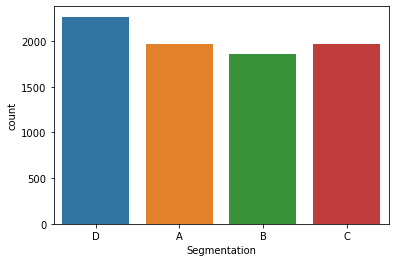

In [56]:
# Plot y
sns.countplot(x="Segmentation", data=raw)

In [57]:
# label encoding for categorical data
raw['Gender'].astype('category')
raw['Ever_Married'].astype('category')
raw['Graduated'].astype('category')
raw['Profession'].astype('category')
raw['Spending_Score'].astype('category')
raw['Var_1'].astype('category')
le = preprocessing.LabelEncoder()
raw['Gender_Cat'] = le.fit_transform(raw['Gender'])
raw['Ever_Married_Cat'] = le.fit_transform(raw['Ever_Married'])
raw['Graduated_Cat'] = le.fit_transform(raw['Graduated'])
raw['Profession_Cat'] = le.fit_transform(raw['Profession'])
raw['Spending_Score_Cat'] = le.fit_transform(raw['Spending_Score'])
raw['Var_1_Cat'] = le.fit_transform(raw['Var_1'])

In [58]:
raw = raw.dropna()

In [91]:
raw.Work_Experience.unique()

array([ 1.,  0.,  4.,  9., 12.,  3., 13.,  5.,  8., 14.,  7.,  2.,  6.,
       10., 11.])

In [59]:
# train test split
# split data into training and testing sets
# Split the data into training and testing sets
raw_cat = raw.drop(["Gender","Ever_Married","Graduated","Profession","Spending_Score","Var_1"], axis = 1)


features = raw_cat.drop(['Segmentation'], axis = 1)
feature_list = list(features.columns)
features_np = np.array(features)

labels = raw_cat[['Segmentation']]
labels_np = np.array(labels)[:,0]

label_unique = list(set(labels_np))

train_features, test_features, train_labels, test_labels = train_test_split(features_np, labels_np, test_size = 0.20, 
                                                                            random_state = 42)

print(feature_list)
print('Features Shape:', features_np.shape)
print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)


# normalize x
scaler = MinMaxScaler()
features = scaler.fit_transform(features_np)
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

['Age', 'Work_Experience', 'Family_Size', 'Gender_Cat', 'Ever_Married_Cat', 'Graduated_Cat', 'Profession_Cat', 'Spending_Score_Cat', 'Var_1_Cat']
Features Shape: (6665, 9)
Training Features Shape: (5332, 9)
Training Labels Shape: (5332,)
Testing Features Shape: (1333, 9)
Testing Labels Shape: (1333,)


#### Utility functions

In [7]:
def distortion(X, n_cluster, model):
    ncluster = np.arange(2, n_cluster)
    inertia = []
    for acluster in ncluster:
        clf=model(acluster, random_state=42).fit(X) 
        inertia.append(clf.inertia_)
    inertia = np.array(inertia)
    plt.plot(ncluster,inertia, marker='o')
    plt.xticks(np.arange(min(ncluster), max(ncluster)+1, 1.0))
    plt.xlabel('Number of Clusters')
    plt.ylabel('Distortion')
    plt.title('Choosing Best k with Inertia - Customer Segmentation')
    plt.show()
    
def silhoutte(X, n_cluster, model):
#     https://www.analyticsvidhya.com/blog/2021/05/k-mean-getting-the-optimal-number-of-clusters/
    ncluster = np.arange(2, n_cluster)
    silhouette_avg = []
    for acluster in ncluster:
        clf=model(acluster, random_state=42).fit(X) 
#         cluster_labels = clf.labels_
        cluster_labels=clf.predict(X)
        # silhouette score
        silhouette_avg.append(silhouette_score(X, cluster_labels))
              
    plt.plot(ncluster,silhouette_avg,'bx-')
    plt.xlabel('Number of Clusters') 
    plt.xticks(np.arange(min(ncluster), max(ncluster)+1, 1.0))
    plt.ylabel('Silhouette score') 
    plt.title('Choosing Best k with Silhouette score - Customer Segmentation')
    plt.show()
    
    
def silhoutte_plot(X, n_cluster, model):
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
    ncluster = np.arange(2, n_cluster)
#     print(model)
    for acluster in ncluster:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (acluster + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 42 for reproducibility.
        clf=model(acluster, random_state=42).fit(X) 
#         cluster_labels = clf.labels_
        cluster_labels=clf.predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print(
            "For n_clusters =",
            acluster,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(acluster):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / acluster)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / acluster)
        ax2.scatter(
            X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )

        # Labeling the clusters
        if clf.__module__ =='sklearn.cluster._kmeans':
#             print(model)
            centers = clf.cluster_centers_
        else:
            centers = clf.means_
        # Draw white circles at cluster centers
        ax2.scatter(
            centers[:, 0],
            centers[:, 1],
            marker="o",
            c="white",
            alpha=1,
            s=200,
            edgecolor="k",
        )

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d for customer segmentation"
            % acluster,
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

    
def EM_BIC (X, n_cluster):
#     https://towardsdatascience.com/gaussian-mixture-model-clusterization-how-to-select-the-number-of-components-clusters-553bef45f6e4
    ncluster = np.arange(2, n_cluster)
    bics=[]
    bics_err=[]
    random=20
    for acluster in ncluster:
        tmp_bic=[]
        for randomstate in range(random):
            clf=GaussianMixture(acluster, random_state=randomstate).fit(X) 
            tmp_bic.append(clf.bic(X))
        val=np.mean(tmp_bic)
        err=np.std(tmp_bic)
        bics.append(val)
        bics_err.append(err)

    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
        
    ax1.errorbar(ncluster,bics, yerr=bics_err, label='BIC')
    ax1.set_title("BIC Scores")
    ax1.set_xticks(ncluster)
    ax1.set_xlabel("Number of Clusters")
    ax1.set_ylabel("BIC")

    ax2.errorbar(ncluster, np.gradient(bics), yerr=bics_err, label='BIC')
    ax2.set_title("Gradient of BIC Scores")
    ax2.set_xticks(ncluster)
    ax2.set_xlabel("Number of Clusters")
    ax2.set_ylabel("grad(BIC)")

###### K Means

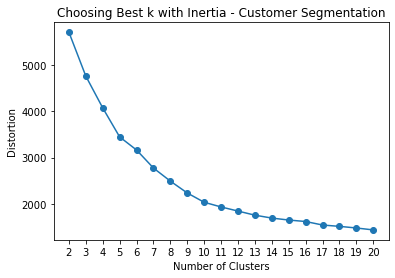

In [8]:
distortion(features, 21, KMeans)

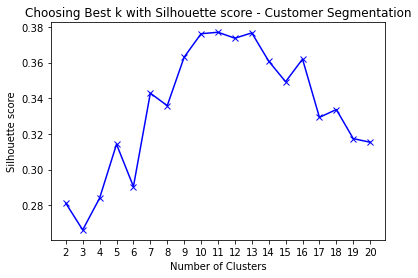

In [9]:
silhoutte(features, 21, KMeans)

For n_clusters = 2 The average silhouette_score is : 0.28116132816351735
For n_clusters = 3 The average silhouette_score is : 0.26616772965510377
For n_clusters = 4 The average silhouette_score is : 0.2839951540234267
For n_clusters = 5 The average silhouette_score is : 0.31419391517074974
For n_clusters = 6 The average silhouette_score is : 0.2904833752169459
For n_clusters = 7 The average silhouette_score is : 0.3428208083828353
For n_clusters = 8 The average silhouette_score is : 0.3358241751221861
For n_clusters = 9 The average silhouette_score is : 0.36303260499774176
For n_clusters = 10 The average silhouette_score is : 0.37613626744245393
For n_clusters = 11 The average silhouette_score is : 0.37697676196428703


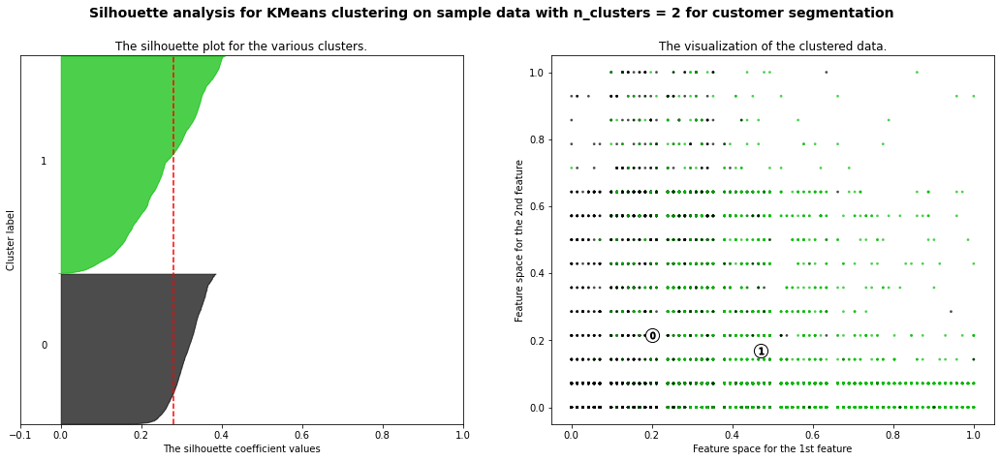

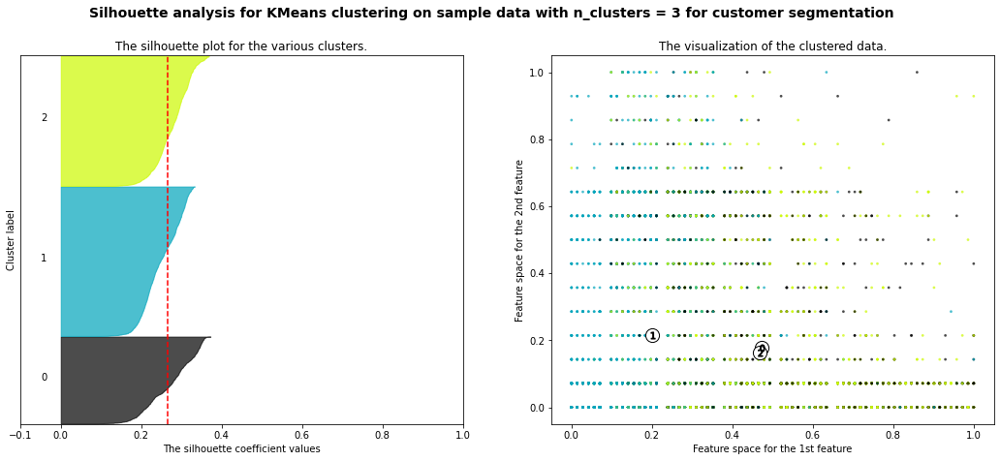

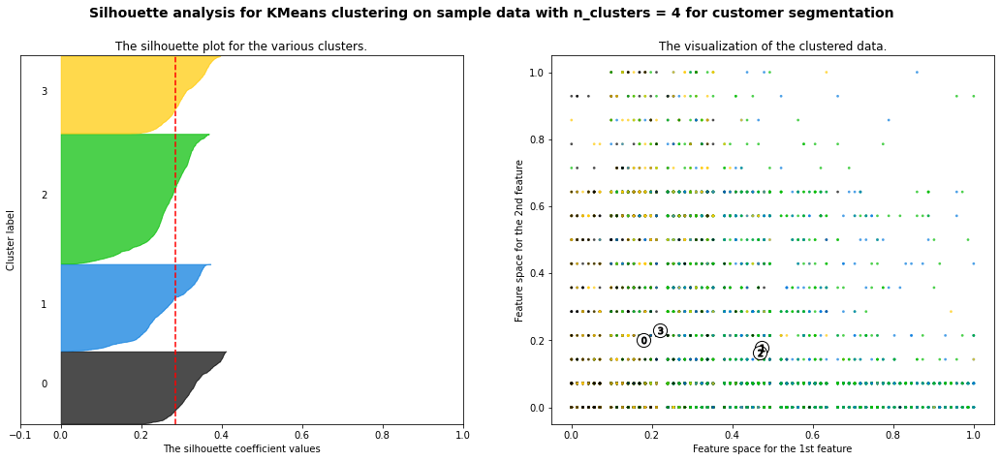

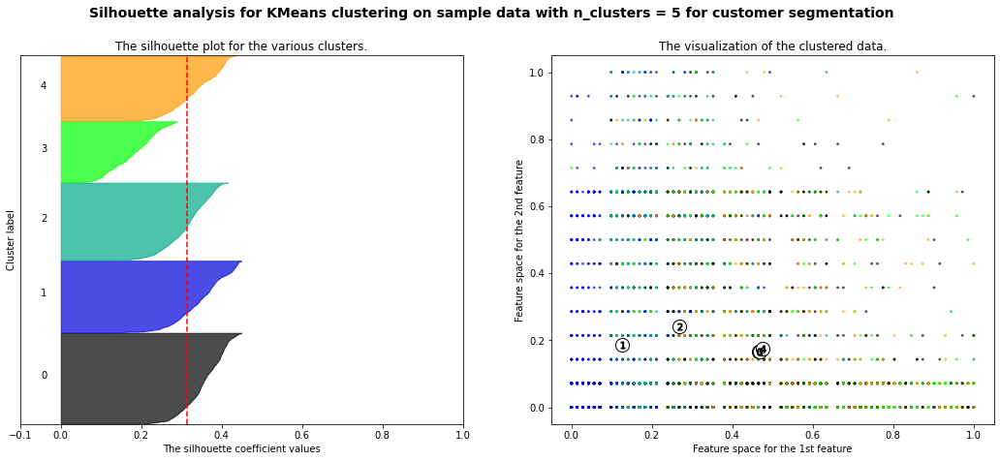

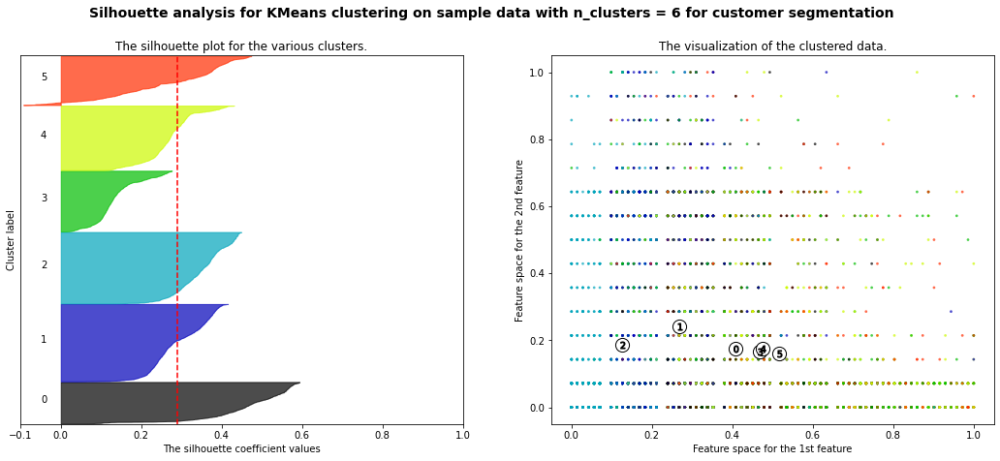

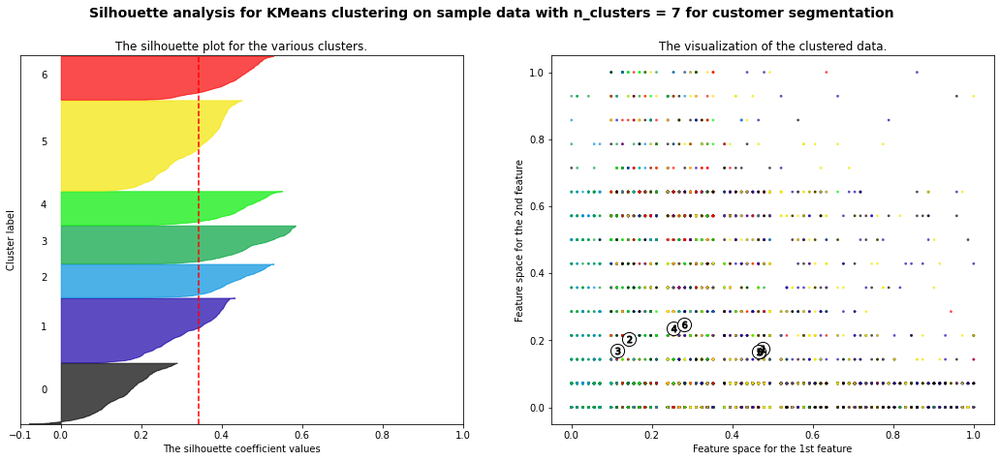

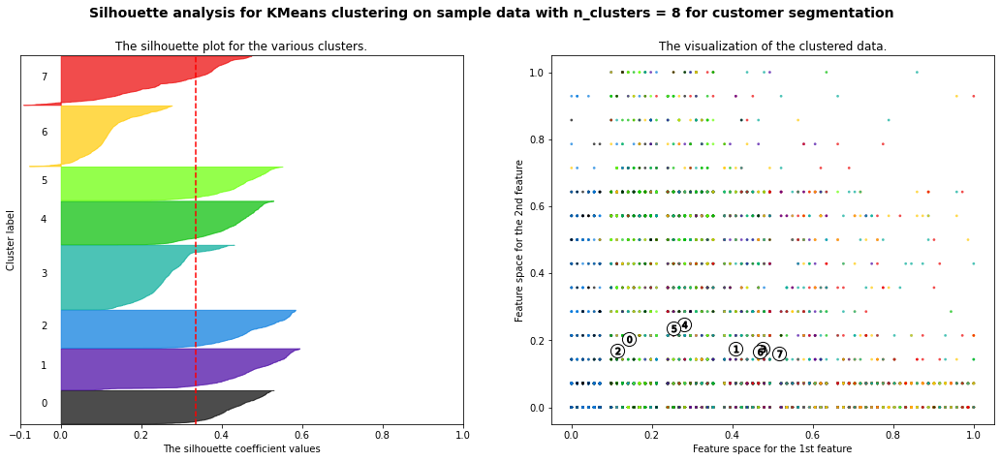

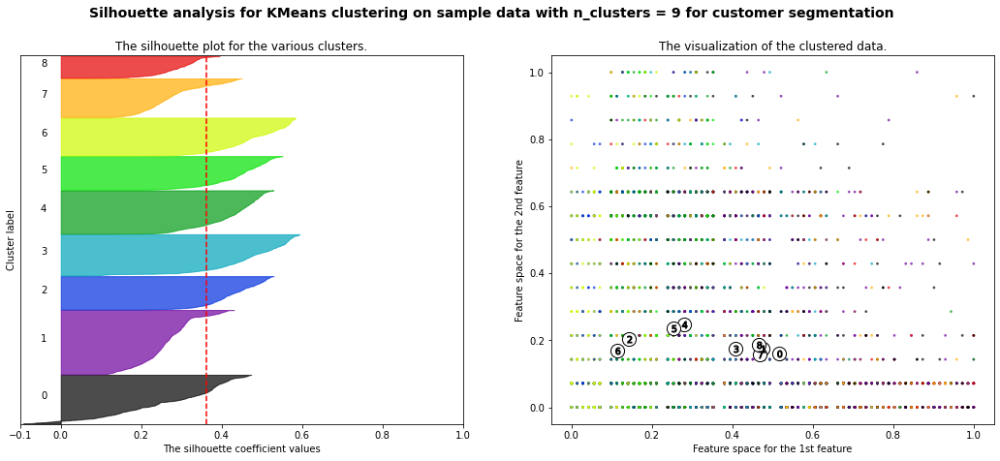

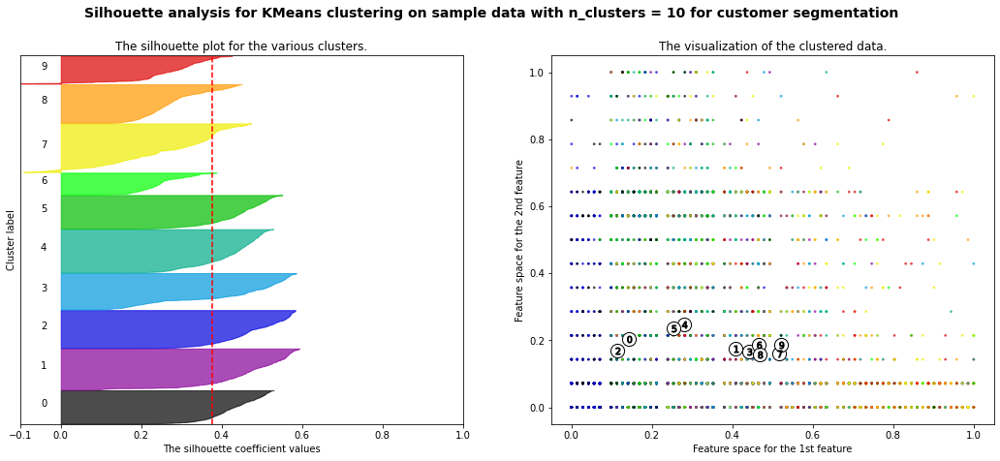

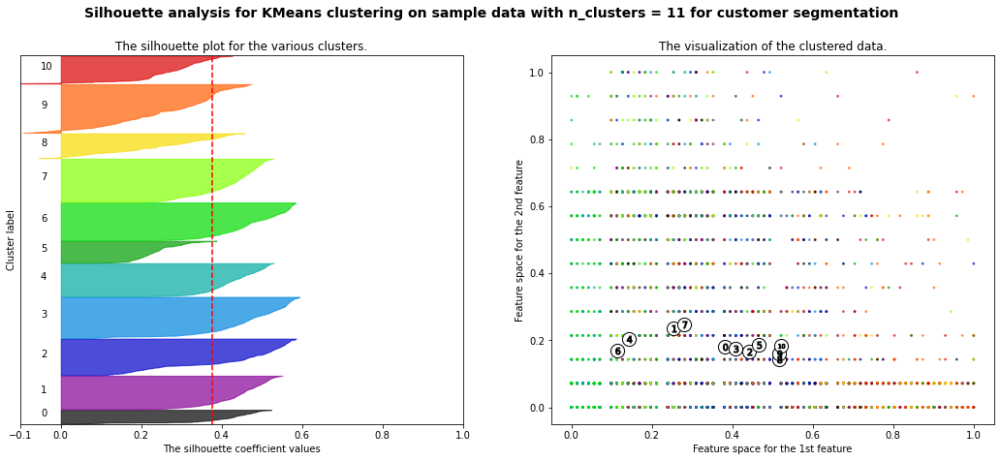

In [10]:
silhoutte_plot(features, 12, KMeans)

In [81]:
clf=KMeans(11, random_state=42).fit(features) 
cluster_labels=clf.predict(features)
cluster_labels = pd.DataFrame(cluster_labels, columns = ['cluster'])
labels = labels.rename(columns = {'Segmentation': 'original_label'})
labels = labels.reset_index()
result = labels.join(cluster_labels)

In [83]:
result['COUNTER'] =1    
group_data = result.groupby(['original_label','cluster'])['COUNTER'].sum() #sum function
print(group_data)

original_label  cluster
A               0           64
                1          206
                2           75
                3          103
                4          119
                5          153
                6           81
                7          270
                8          174
                9          248
                10         123
B               0           88
                1          124
                2          181
                3          232
                4           62
                5          121
                6           47
                7          186
                8          103
                9          246
                10         182
C               0           61
                1           82
                2          403
                3          402
                4           68
                5           46
                6           61
                7          127
                8           50
               

###### Expectation Maximization

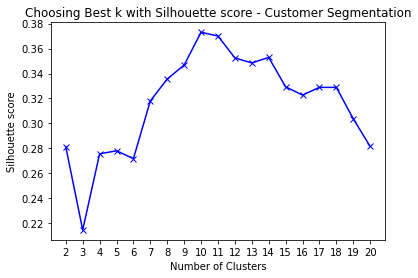

In [11]:
silhoutte(features, 21, GaussianMixture)

For n_clusters = 2 The average silhouette_score is : 0.28116132816351735
For n_clusters = 3 The average silhouette_score is : 0.21459475363030756
For n_clusters = 4 The average silhouette_score is : 0.2756088123754085
For n_clusters = 5 The average silhouette_score is : 0.2780211669086068
For n_clusters = 6 The average silhouette_score is : 0.2717626453413917
For n_clusters = 7 The average silhouette_score is : 0.3180688358695277
For n_clusters = 8 The average silhouette_score is : 0.3356182830576539
For n_clusters = 9 The average silhouette_score is : 0.34681281859836954
For n_clusters = 10 The average silhouette_score is : 0.3730999692730712
For n_clusters = 11 The average silhouette_score is : 0.37002445320713506
For n_clusters = 12 The average silhouette_score is : 0.3525275348198022
For n_clusters = 13 The average silhouette_score is : 0.3484912180290162
For n_clusters = 14 The average silhouette_score is : 0.35290099809244935
For n_clusters = 15 The average silhouette_score is : 

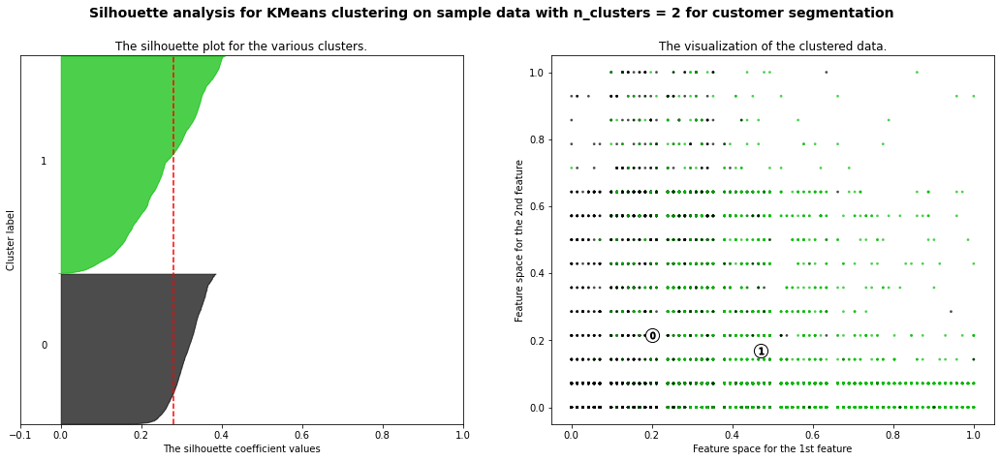

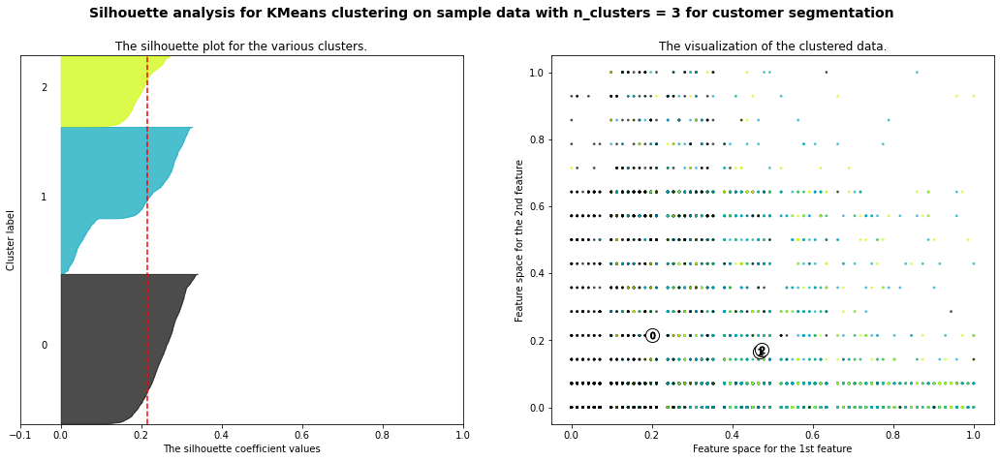

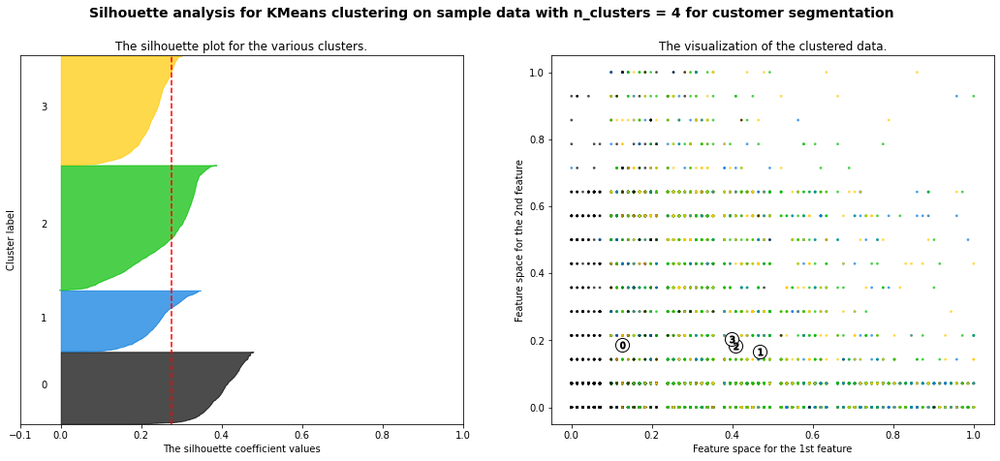

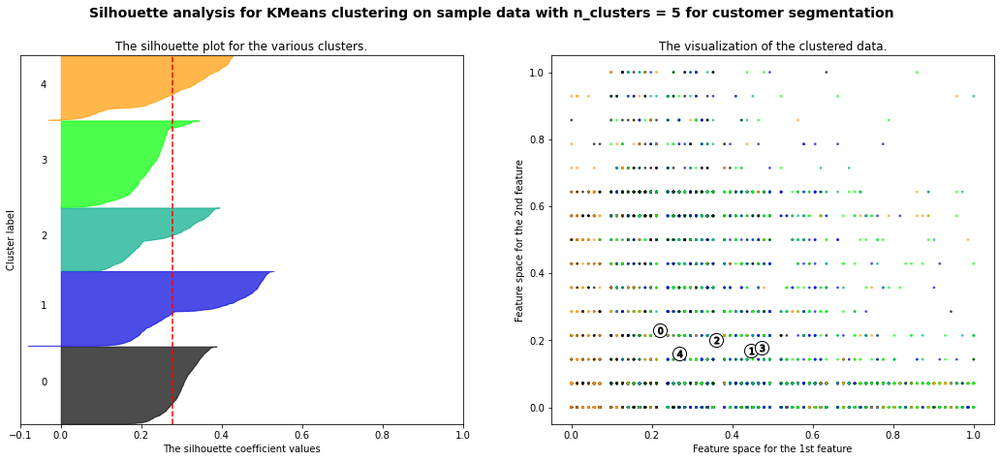

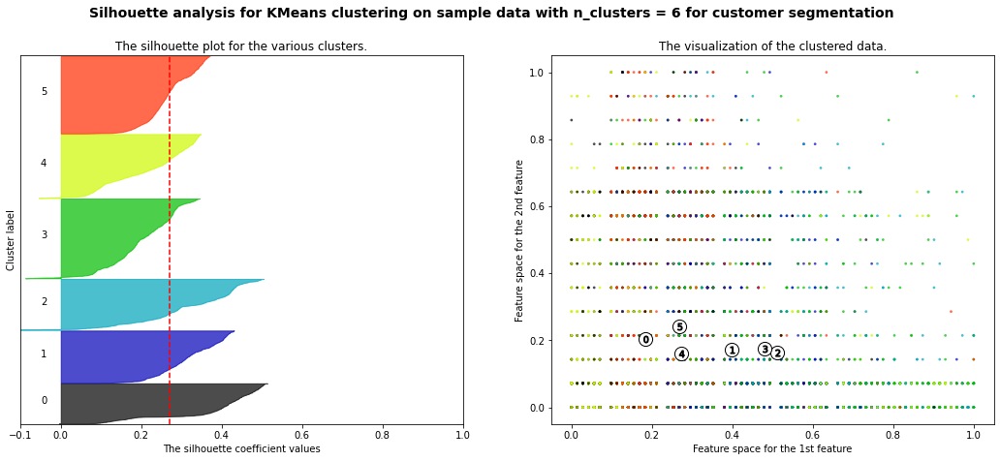

...

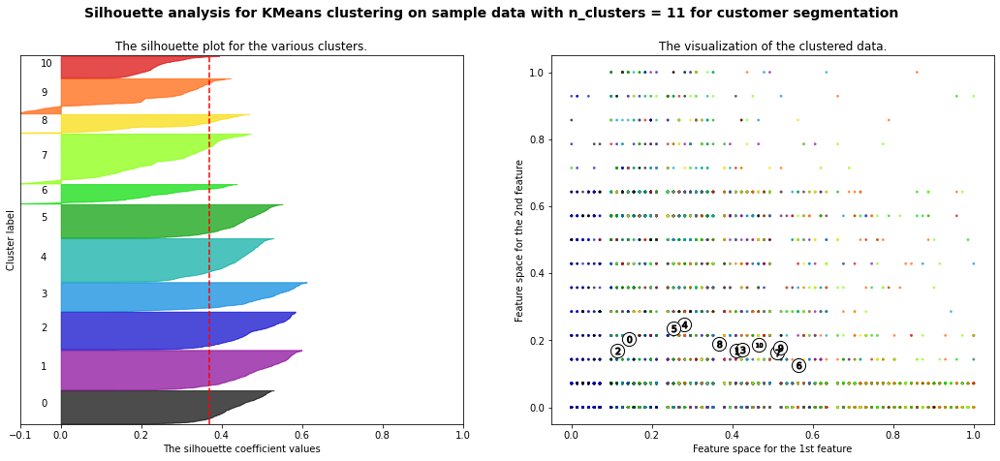

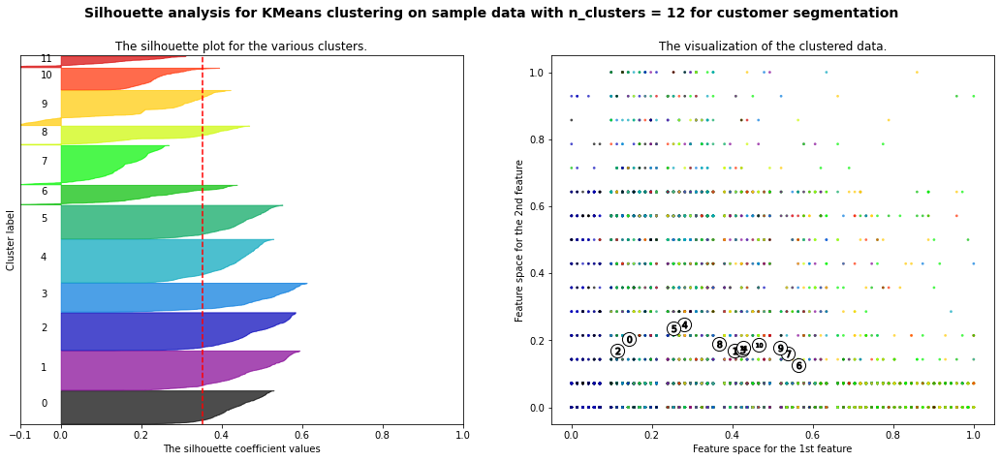

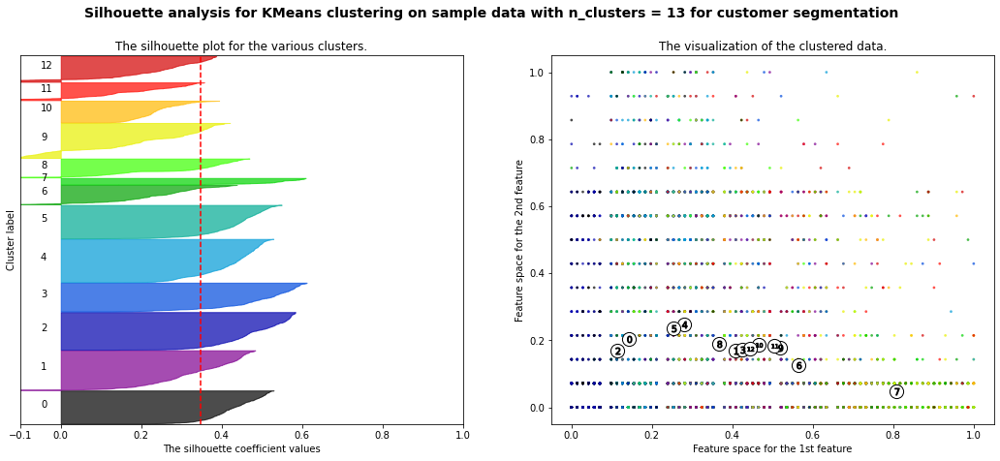

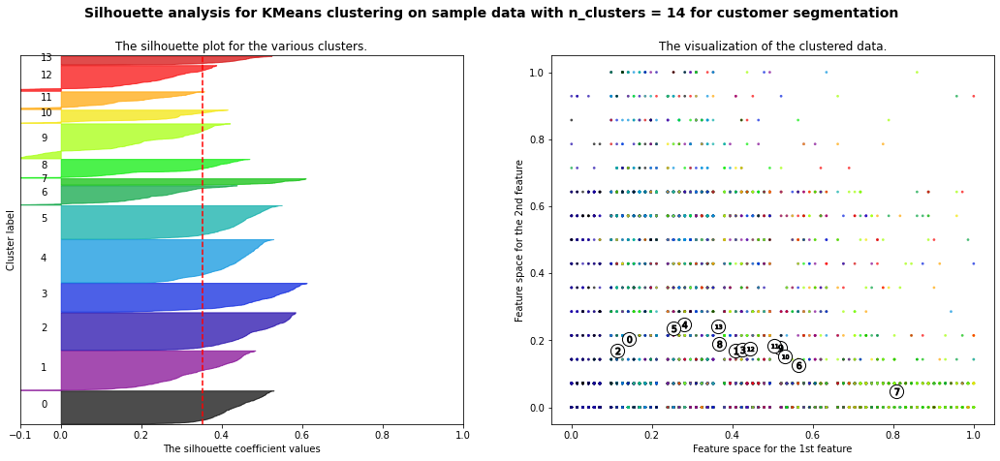

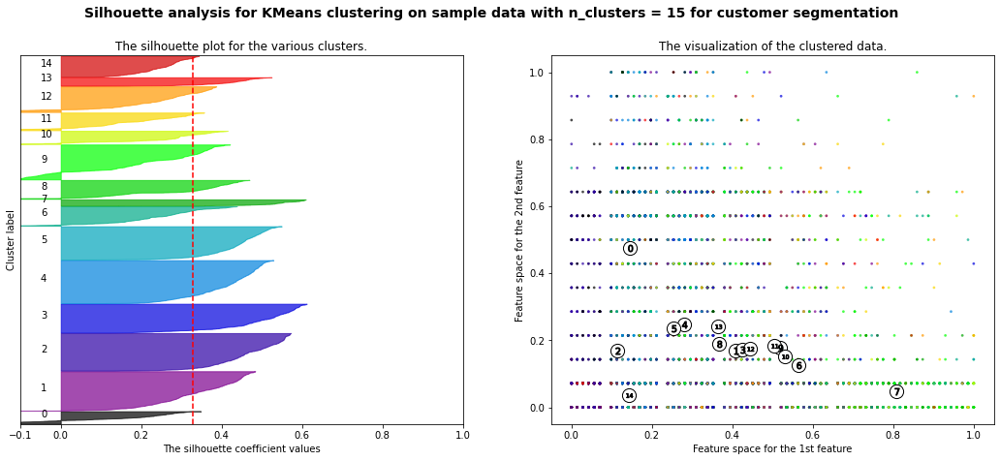

In [12]:
silhoutte_plot(features, 16, GaussianMixture)

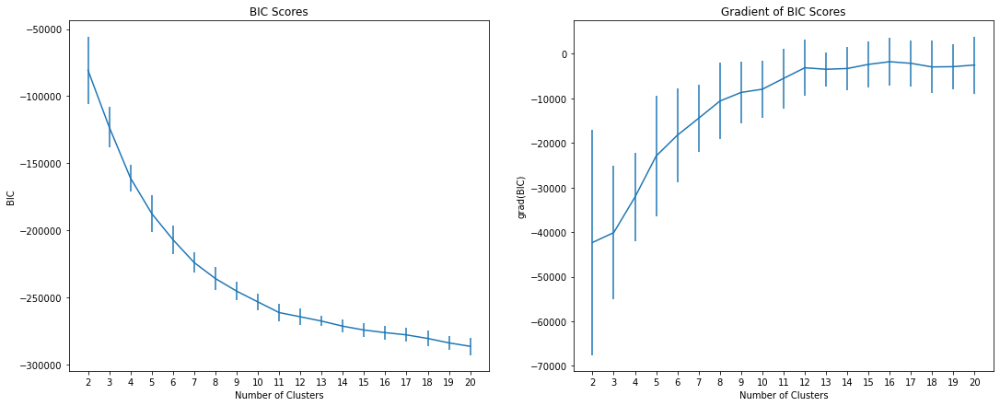

In [13]:
EM_BIC(features, 21)

In [84]:
clf=GaussianMixture(10, random_state=42).fit(features) 
cluster_labels=clf.predict(features)
cluster_labels = pd.DataFrame(cluster_labels, columns = ['cluster'])
labels = labels.rename(columns = {'Segmentation': 'original_label'})
labels = labels.reset_index()
result = labels.join(cluster_labels)

In [85]:
result['COUNTER'] =1    
group_data = result.groupby(['original_label','cluster'])['COUNTER'].sum() #sum function
print(group_data)

original_label  cluster
A               0          119
                1           95
                2           81
                3           62
                4          270
                5          206
                6          153
                7          256
                8          238
                9          136
B               0           62
                1          224
                2           47
                3          141
                4          186
                5          124
                6          121
                7          254
                8          191
                9          222
C               0           68
                1          395
                2           61
                3          319
                4          127
                5           82
                6           46
                7          276
                8          111
                9          235
D               0          361
               

###### PCA

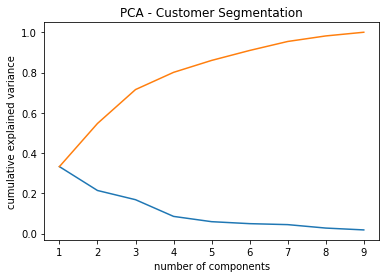

In [14]:
pca = PCA(random_state=42).fit(features)

# https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_))
plt.title("Component-wise and Cumulative Explained Variance")
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("PCA - Customer Segmentation")
plt.show()

In [15]:
## keep about 80% of the variance
pca = PCA(n_components=4, random_state=42)
pca_result = pca.fit_transform(features)
print('PCA Transformed Features Shape:', pca_result.shape)
train_features_PCA, test_features_PCA, train_labels, test_labels = train_test_split(pca_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)
print('PCA Transformed Training Features Shape:', train_features_PCA.shape)
print('Training Labels Shape:', train_labels.shape)
print('PCA Transformed Testing Features Shape:', test_features_PCA.shape)
print('Testing Labels Shape:', test_labels.shape)

PCA Transformed Features Shape: (6665, 4)
PCA Transformed Training Features Shape: (5332, 4)
Training Labels Shape: (5332,)
PCA Transformed Testing Features Shape: (1333, 4)
Testing Labels Shape: (1333,)


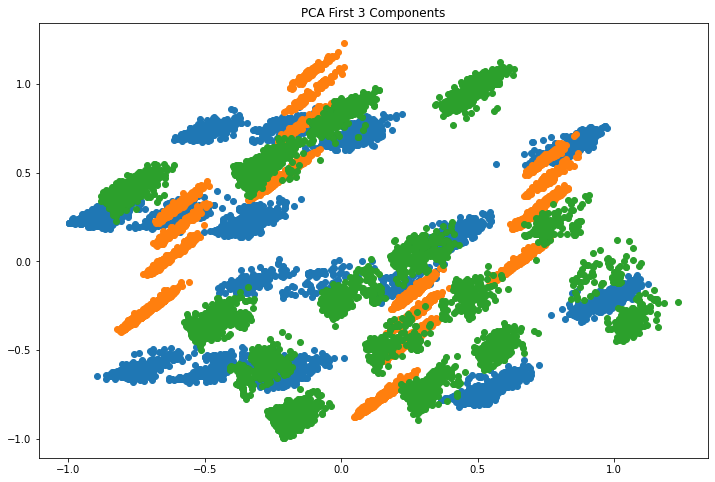

In [16]:
plt.figure(figsize=(12,8))
plt.title('PCA First 3 Components')
plt.scatter(pca_result[:,0], pca_result[:,1])
plt.scatter(pca_result[:,1], pca_result[:,2])
plt.scatter(pca_result[:,2], pca_result[:,0])

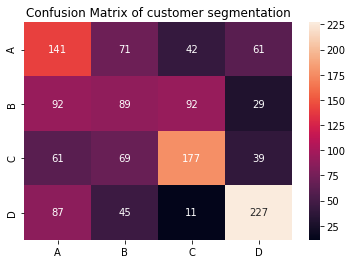

Accuracy
0.47561890472618157
--------------------------------------------------------------------------------------------------------------


In [17]:
## rerun NN after PCA

MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_PCA, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_PCA)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

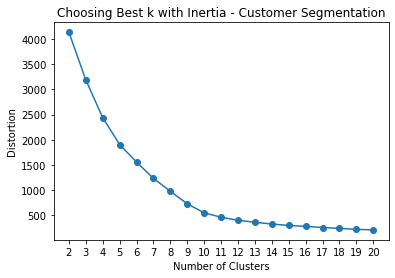

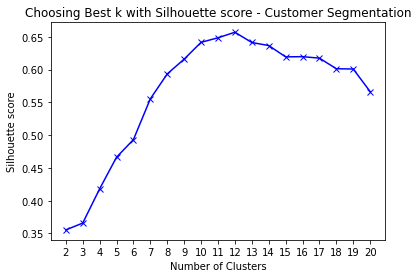

For n_clusters = 2 The average silhouette_score is : 0.3554569197671745
For n_clusters = 3 The average silhouette_score is : 0.36586942621107293
For n_clusters = 4 The average silhouette_score is : 0.417985170410602
For n_clusters = 5 The average silhouette_score is : 0.46632062128105
For n_clusters = 6 The average silhouette_score is : 0.49316836363129857
For n_clusters = 7 The average silhouette_score is : 0.5553867992253797
For n_clusters = 8 The average silhouette_score is : 0.5933859337258498
For n_clusters = 9 The average silhouette_score is : 0.6159156249988553
For n_clusters = 10 The average silhouette_score is : 0.6415272164681458
For n_clusters = 11 The average silhouette_score is : 0.6484529432094416
For n_clusters = 12 The average silhouette_score is : 0.6569088698709583
For n_clusters = 13 The average silhouette_score is : 0.6412855059499435
For n_clusters = 14 The average silhouette_score is : 0.6366321857561024
For n_clusters = 15 The average silhouette_score is : 0.6193

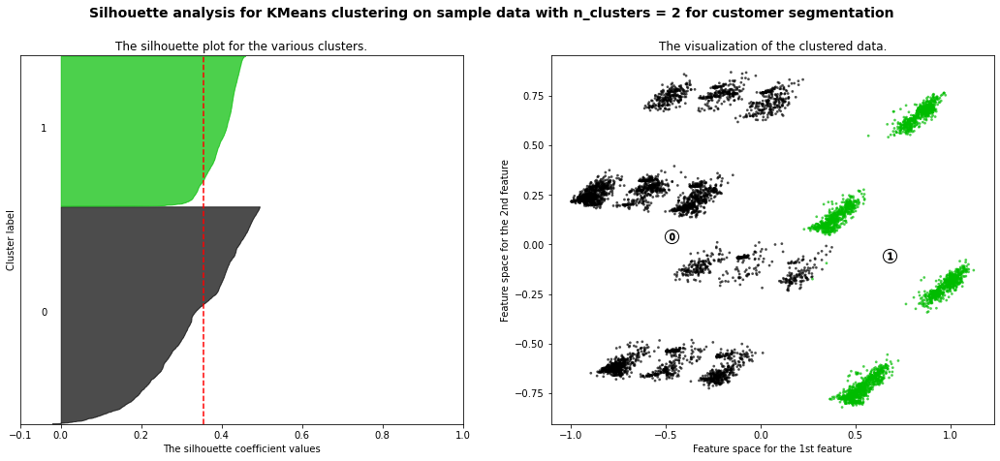

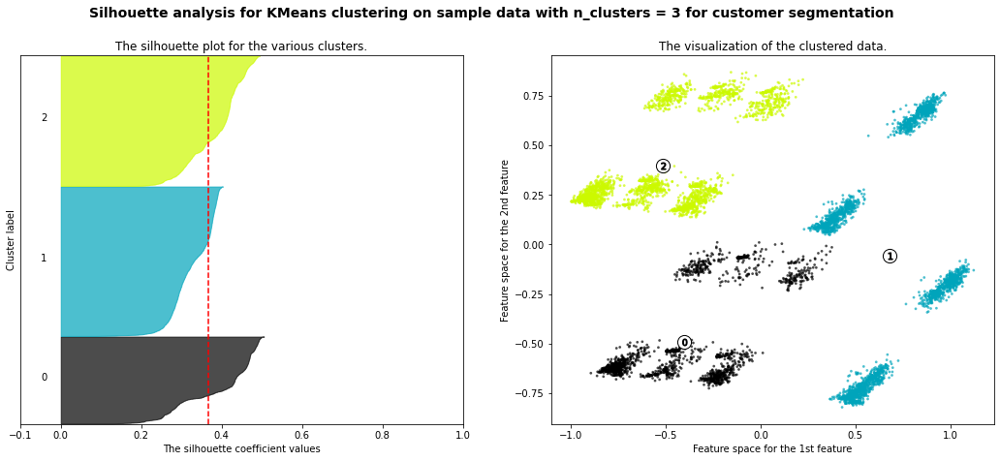

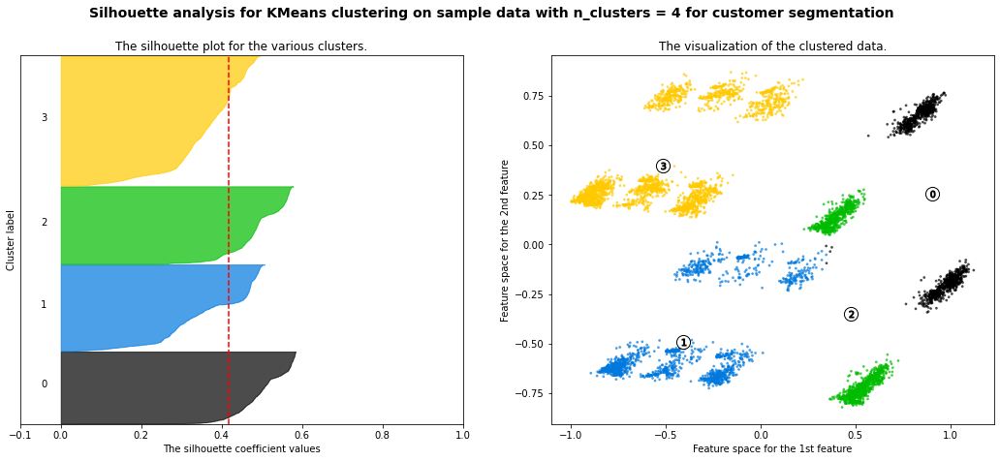

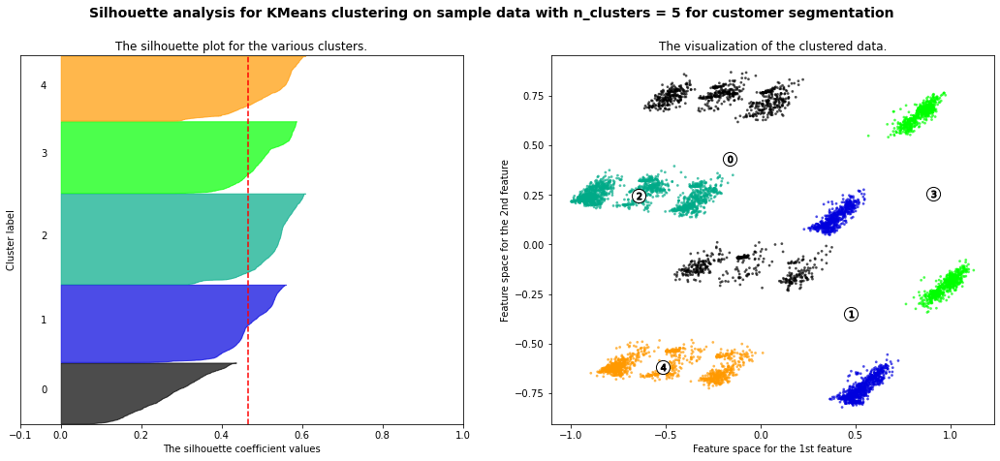

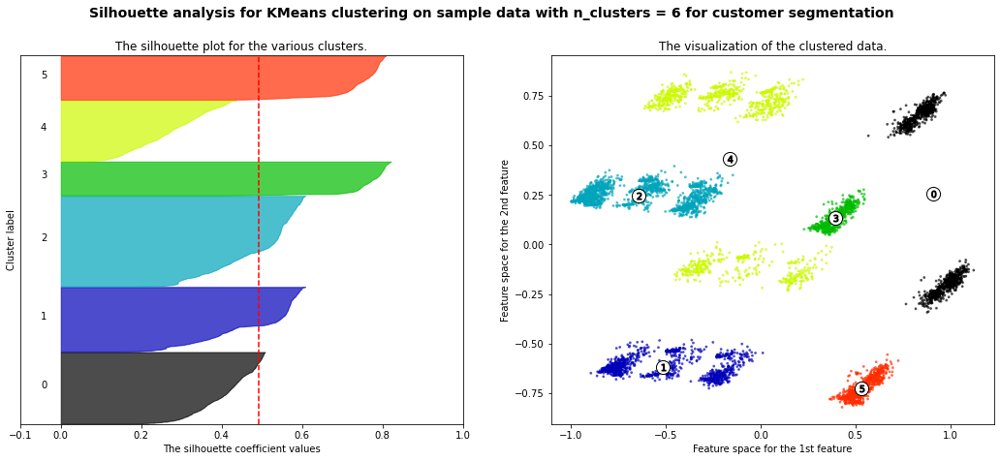

...

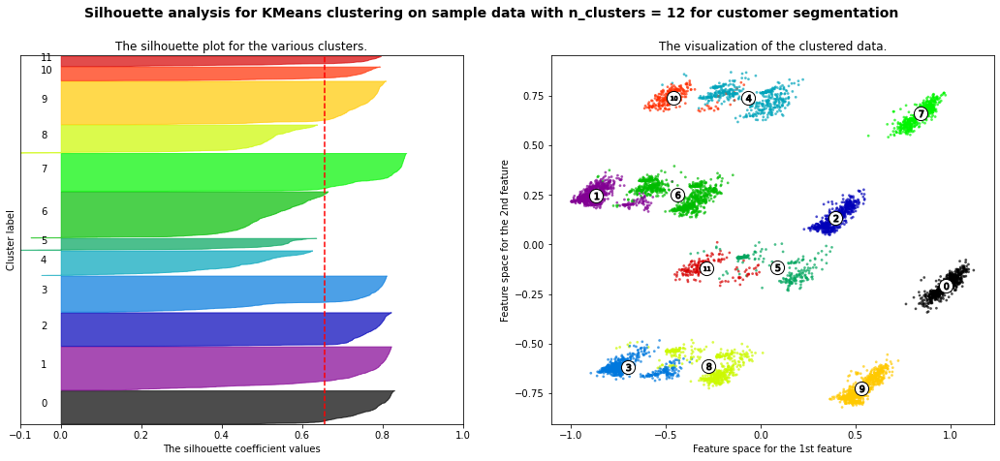

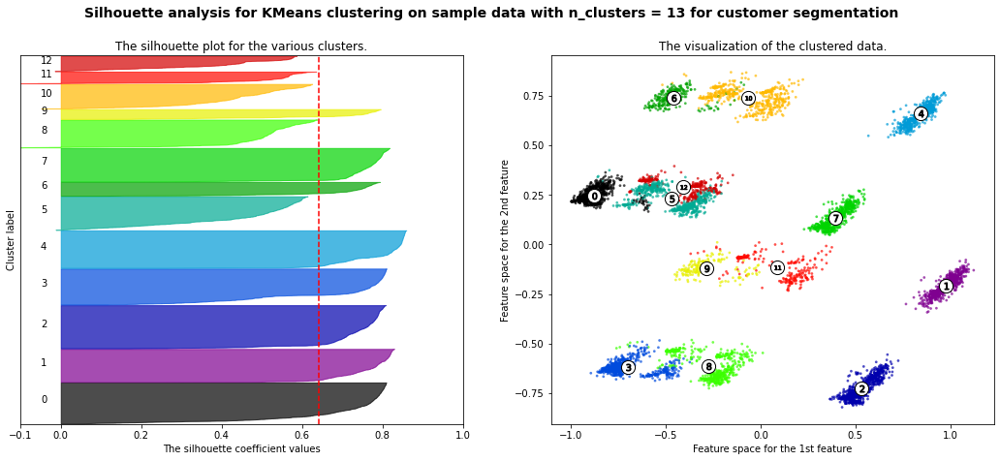

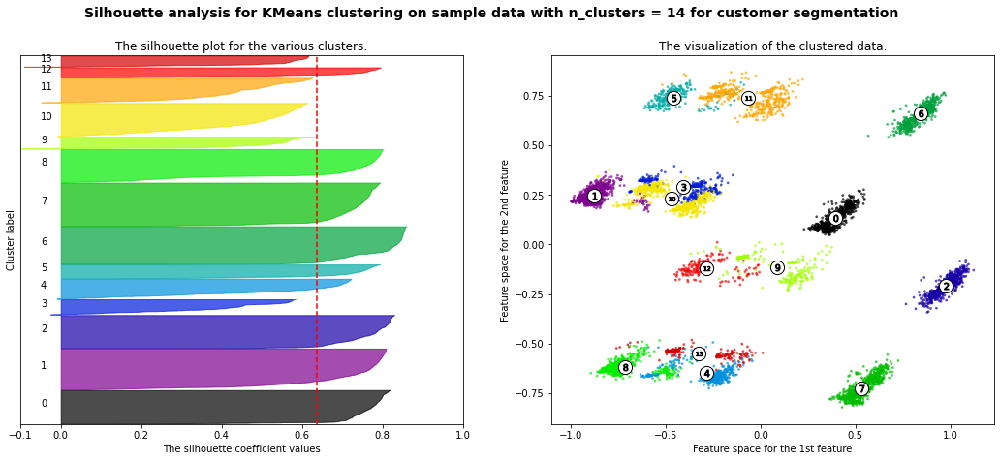

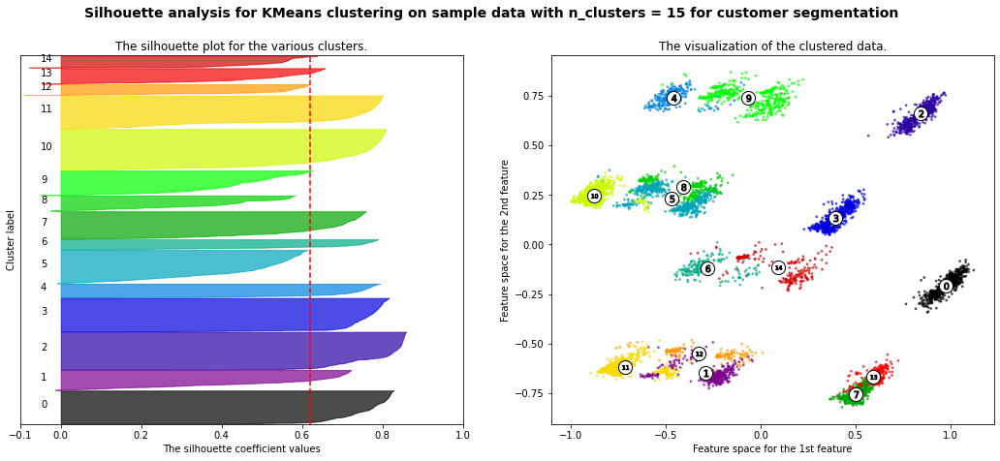

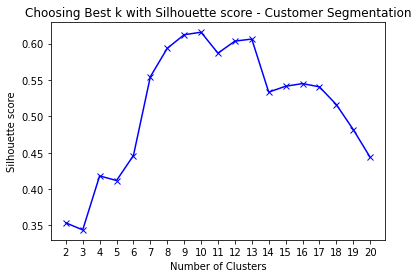

For n_clusters = 2 The average silhouette_score is : 0.3536089414156008
For n_clusters = 3 The average silhouette_score is : 0.34387952064278693
For n_clusters = 4 The average silhouette_score is : 0.41808493499407967
For n_clusters = 5 The average silhouette_score is : 0.41174649312794814
For n_clusters = 6 The average silhouette_score is : 0.44605478529486253
For n_clusters = 7 The average silhouette_score is : 0.5543439610635695
For n_clusters = 8 The average silhouette_score is : 0.5933859337258498
For n_clusters = 9 The average silhouette_score is : 0.6120734275182936
For n_clusters = 10 The average silhouette_score is : 0.6154665722606883
For n_clusters = 11 The average silhouette_score is : 0.5867604020761026
For n_clusters = 12 The average silhouette_score is : 0.603263816696131
For n_clusters = 13 The average silhouette_score is : 0.6061014285406691
For n_clusters = 14 The average silhouette_score is : 0.5331977157335576
For n_clusters = 15 The average silhouette_score is : 0.

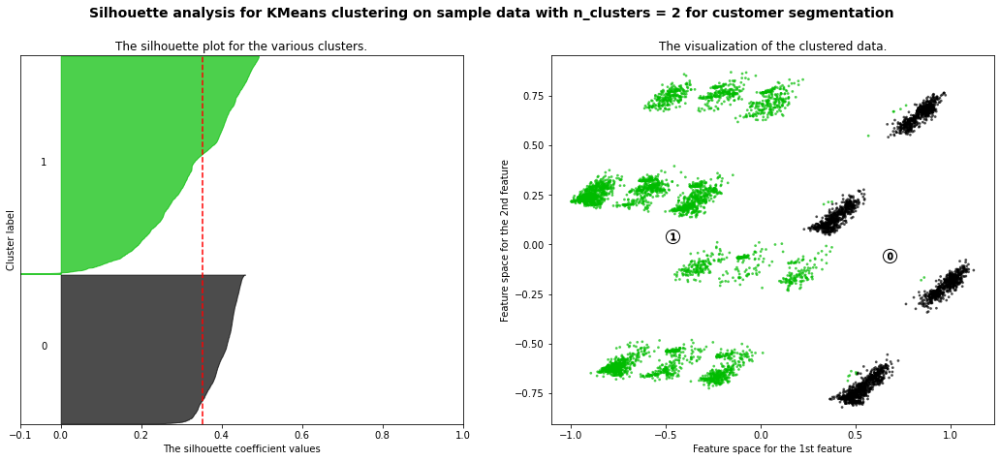

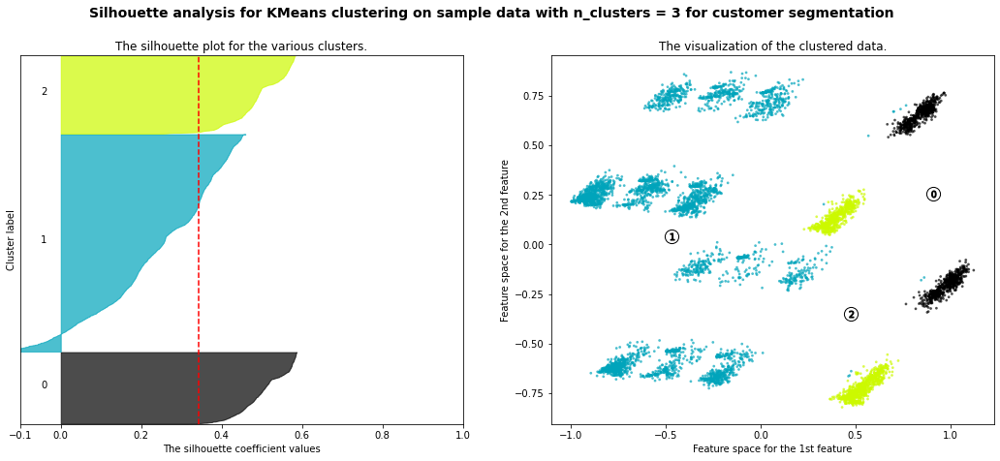

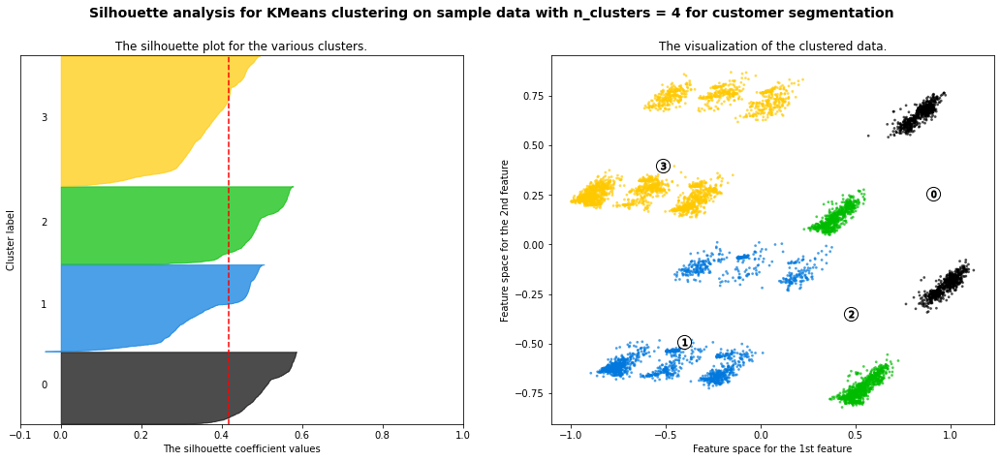

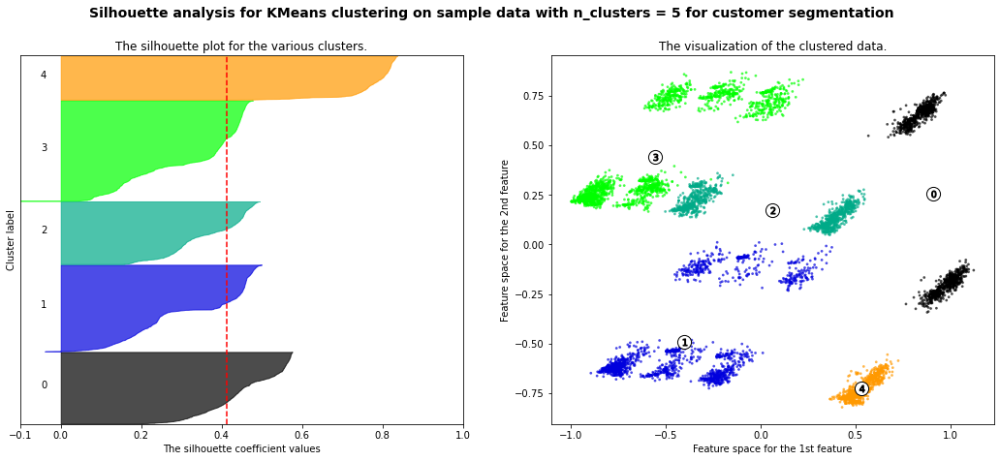

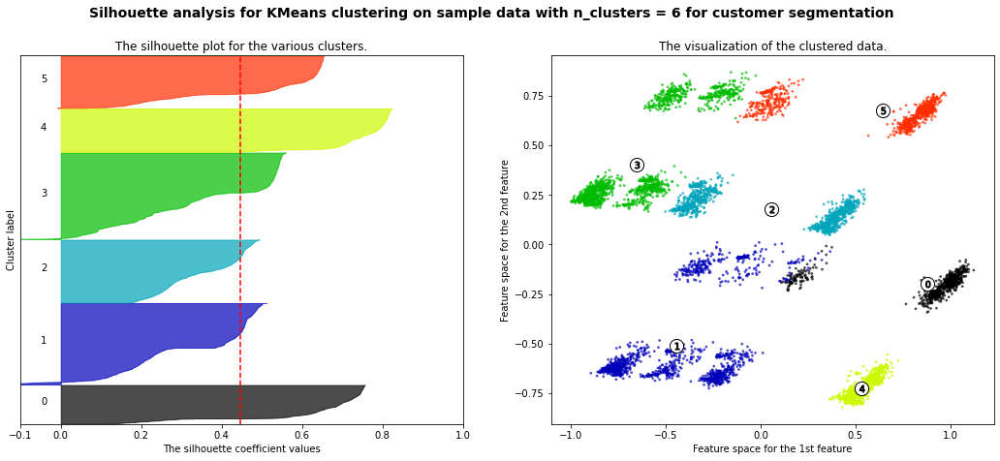

...

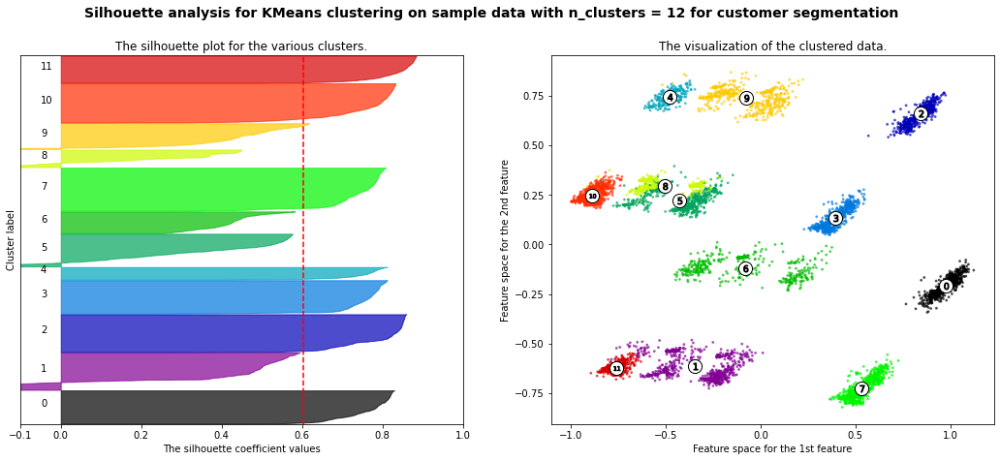

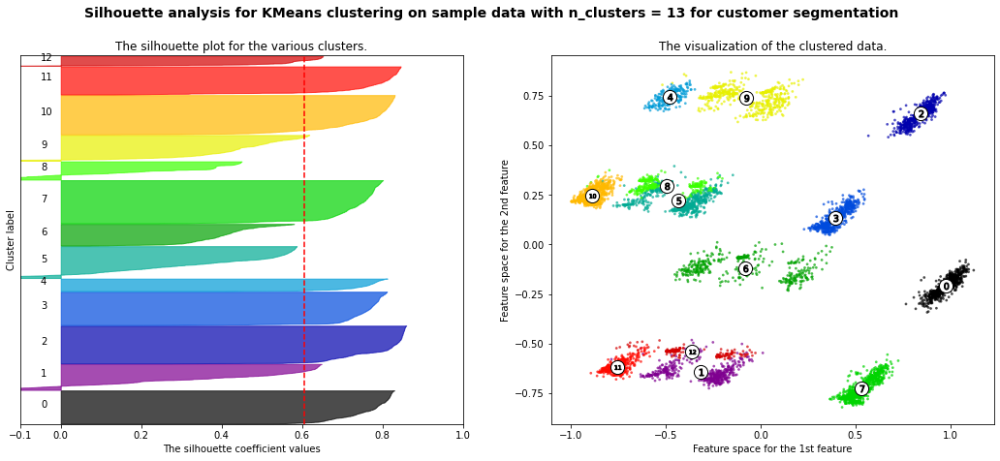

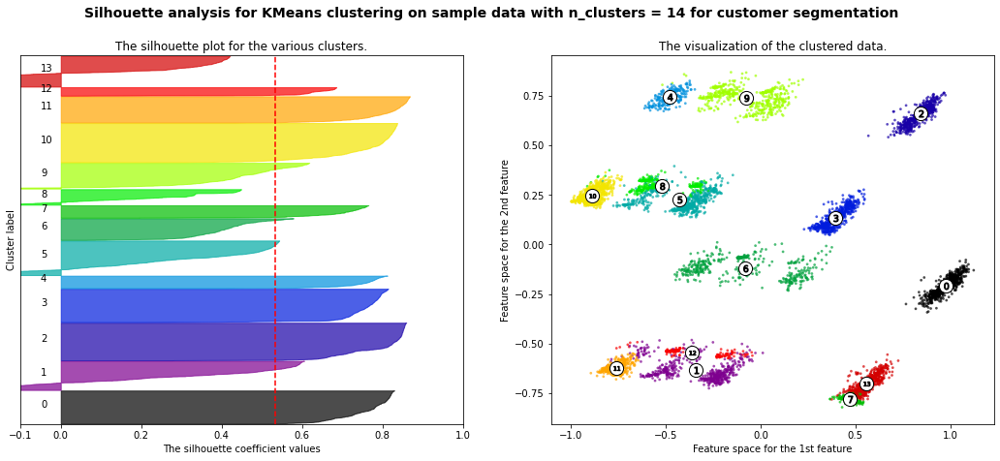

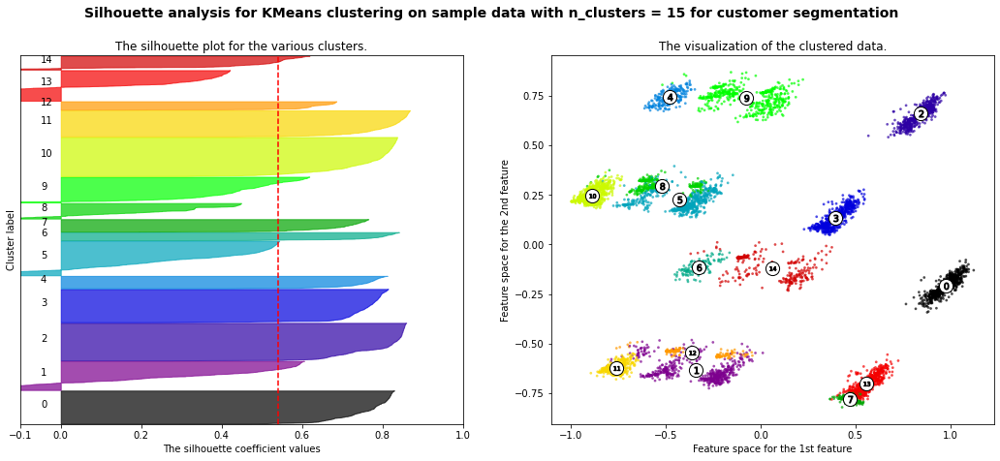

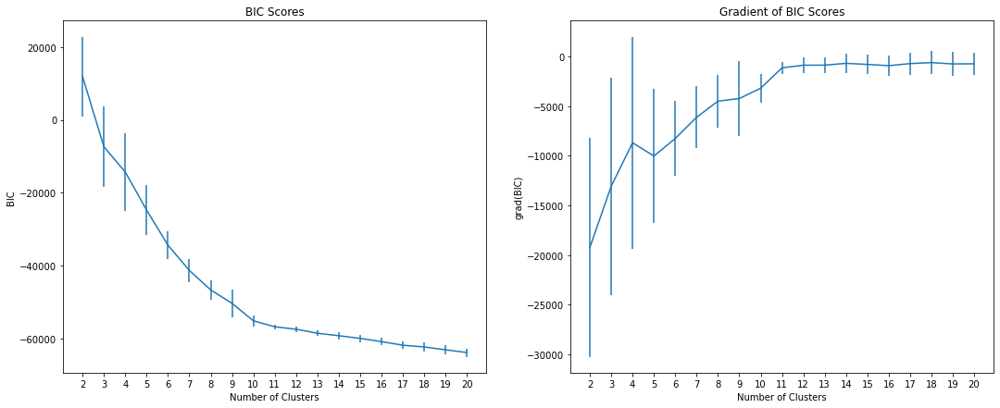

In [18]:
## redo clustering after PCA
distortion(pca_result, 21, KMeans)
silhoutte(pca_result, 21, KMeans)
silhoutte_plot(pca_result, 16, KMeans)
silhoutte(pca_result, 21, GaussianMixture)
silhoutte_plot(pca_result, 16, GaussianMixture)
EM_BIC(pca_result, 21)

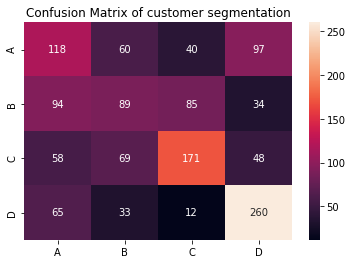

Accuracy
0.47861965491372843
--------------------------------------------------------------------------------------------------------------


In [19]:
## choose 12 cluster using KMEAN for PCA, add as another feature and rerun neural net
clf=KMeans(12, random_state=42).fit(pca_result) 
cluster_labels=clf.predict(pca_result)
cluster_labels = np.reshape(cluster_labels, (-1, 1))

scaler = MinMaxScaler()
cluster_labels = scaler.fit_transform(cluster_labels)

pca_result =np.hstack((pca_result, cluster_labels))


train_features_PCA, test_features_PCA, train_labels, test_labels = train_test_split(pca_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)

## rerun NN after PCA and clusteriong

MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_PCA, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_PCA)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

###### ICA

In [20]:
### choose best number of components of ICA through random forest classfier
for i in range(2,11):
    ica = FastICA(n_components=i, max_iter=10000, tol=0.1,random_state=12) 
    ica_result = ica.fit_transform(features)
    train_features_ICA, test_features_ICA, train_labels, test_labels = train_test_split(ica_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)
    
    clf = RandomForestClassifier(criterion='entropy', max_depth=5,min_samples_split=2, min_samples_leaf = 8, random_state = 42)

    clf.fit(train_features_ICA, train_labels)
    test_pred_decision_tree = clf.predict(test_features_ICA)
    print("For n component =",
            i,metrics.accuracy_score(test_labels, test_pred_decision_tree))

For n component = 2 0.49287321830457614
For n component = 3 0.49362340585146286
For n component = 4 0.5033758439609902
For n component = 5 0.49212303075768943
For n component = 6 0.5071267816954238
For n component = 7 0.5026256564141035
For n component = 8 0.5123780945236309
For n component = 9 0.5071267816954238


/opt/anaconda3/lib/python3.8/site-packages/sklearn/decomposition/_fastica.py:519: UserWarning: n_components is too large: it will be set to 9
  warnings.warn(


For n component = 10 0.5071267816954238


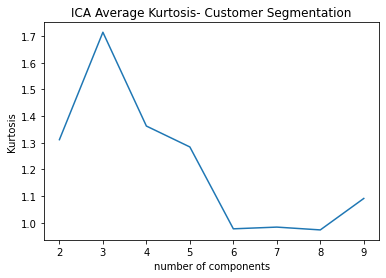

In [21]:
## kurtosis analysis
kurt = []
ncomponent = np.arange(2, 10)
for i in ncomponent:
    ica = FastICA(n_components=i, max_iter=10000, tol=0.1,random_state=12) 
    ica_result = ica.fit_transform(features)
    kurt_i = pd.DataFrame(ica_result)
    kurt_i = kurt_i.kurt(axis=0)
    kurt_i = kurt_i.abs().mean()
    kurt.append(kurt_i)

plt.plot(ncomponent, kurt)
plt.xlabel('number of components')
plt.xticks(ncomponent)
plt.ylabel('Kurtosis')
plt.title("ICA Average Kurtosis- Customer Segmentation")
plt.show()

In [22]:
kurt

[1.3116420860753422,
 1.7142910695906959,
 1.3627105969658295,
 1.2842948853178764,
 0.9774393066119064,
 0.9838702825563244,
 0.9733253078193216,
 1.091250095835654]

In [23]:
## n component chose to be 3
ica = FastICA(n_components=3, max_iter=10000, tol=0.1,random_state=12) 
ica_result = ica.fit_transform(features)
print('ICA Transformed Features Shape:', ica_result.shape)
train_features_ICA, test_features_ICA, train_labels, test_labels = train_test_split(ica_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)
print('ICA Transformed Training Features Shape:', train_features_ICA.shape)
print('Training Labels Shape:', train_labels.shape)
print('ICA Transformed Testing Features Shape:', test_features_ICA.shape)
print('Testing Labels Shape:', test_labels.shape)

ICA Transformed Features Shape: (6665, 3)
ICA Transformed Training Features Shape: (5332, 3)
Training Labels Shape: (5332,)
ICA Transformed Testing Features Shape: (1333, 3)
Testing Labels Shape: (1333,)


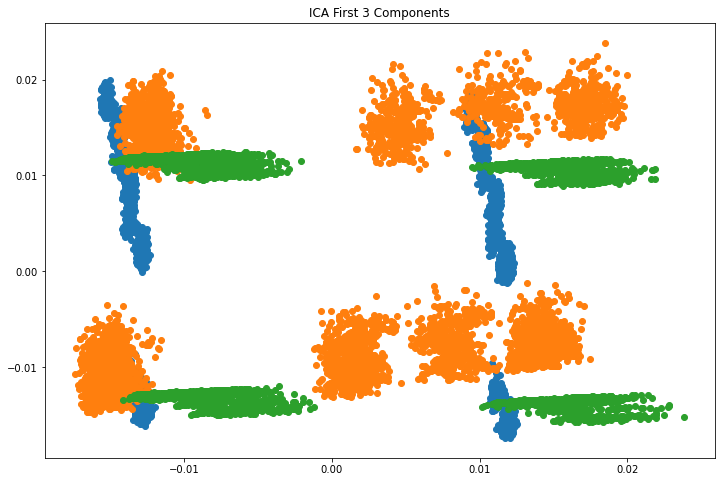

In [24]:
plt.figure(figsize=(12,8))
plt.title('ICA First 3 Components')
plt.scatter(ica_result[:,0], ica_result[:,1])
plt.scatter(ica_result[:,1], ica_result[:,2])
plt.scatter(ica_result[:,2], ica_result[:,0])

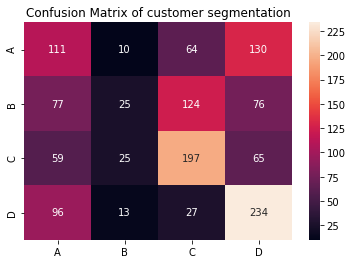

Accuracy
0.4253563390847712
--------------------------------------------------------------------------------------------------------------


In [45]:
MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 60, 40), learning_rate_init=0.01, solver='adam', max_iter = 100000)
MLPclf.fit(train_features_ICA, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_ICA)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

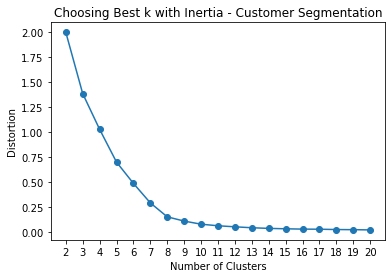

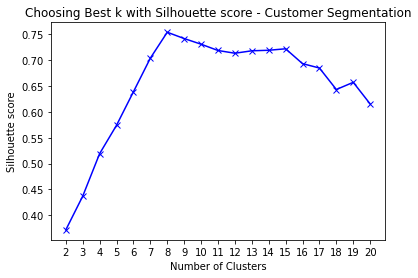

For n_clusters = 2 The average silhouette_score is : 0.3713837918396299
For n_clusters = 3 The average silhouette_score is : 0.4366659217450067
For n_clusters = 4 The average silhouette_score is : 0.5190732610347812
For n_clusters = 5 The average silhouette_score is : 0.5740868421604607
For n_clusters = 6 The average silhouette_score is : 0.6389463000177553
For n_clusters = 7 The average silhouette_score is : 0.704116403796716
For n_clusters = 8 The average silhouette_score is : 0.7543299682430058
For n_clusters = 9 The average silhouette_score is : 0.7421131457980872
For n_clusters = 10 The average silhouette_score is : 0.7311804494233249
For n_clusters = 11 The average silhouette_score is : 0.7189755484608169
For n_clusters = 12 The average silhouette_score is : 0.7136578258429597
For n_clusters = 13 The average silhouette_score is : 0.7183856924403774
For n_clusters = 14 The average silhouette_score is : 0.7194227793330514
For n_clusters = 15 The average silhouette_score is : 0.7222

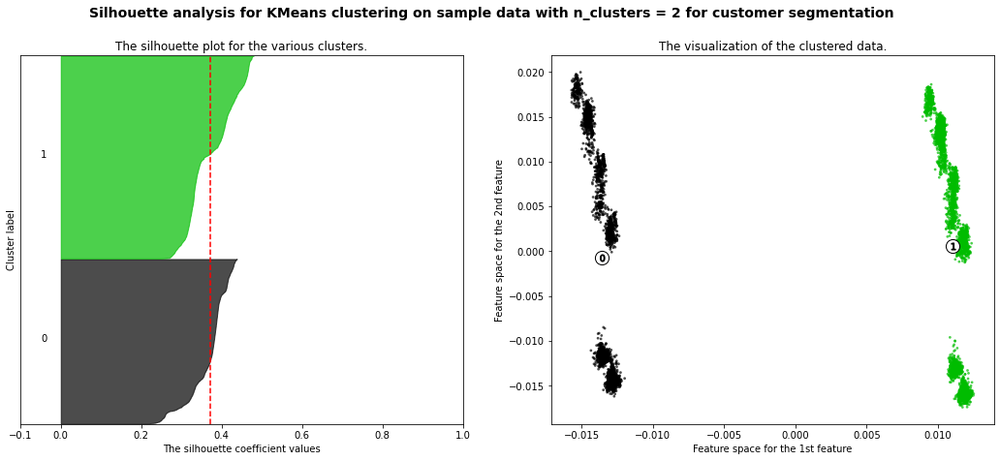

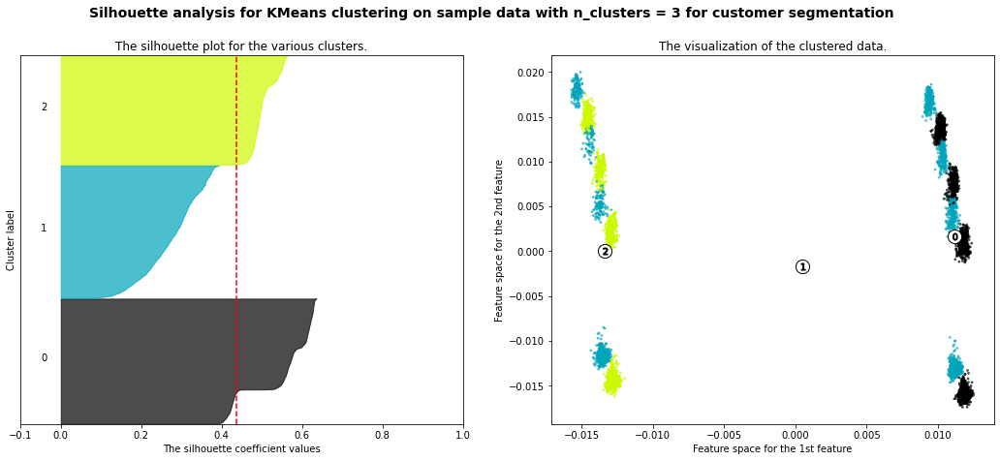

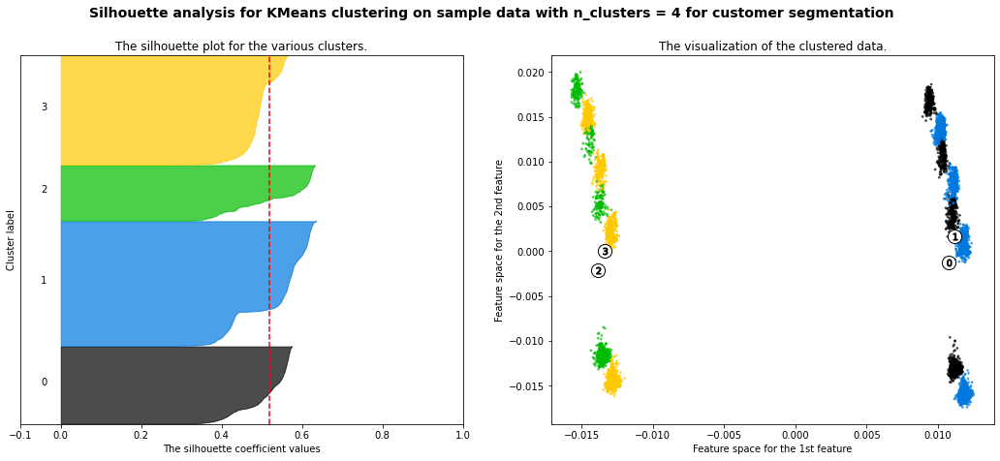

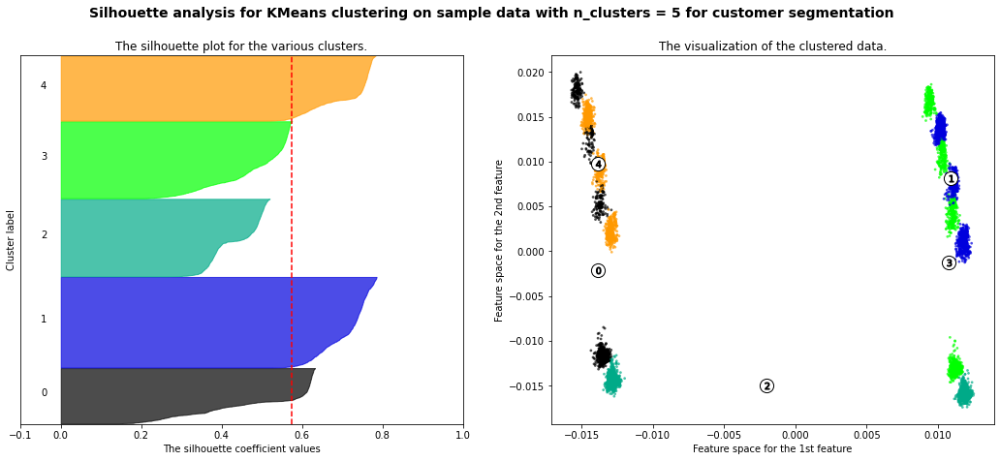

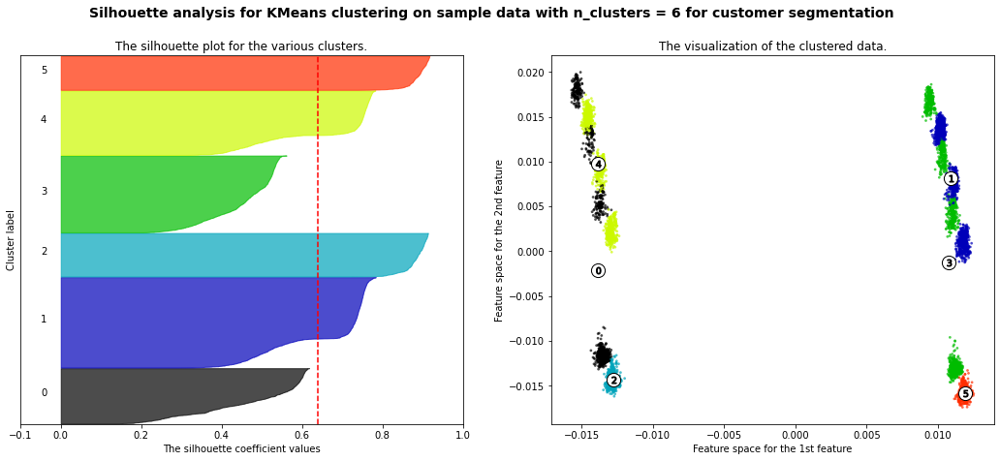

...

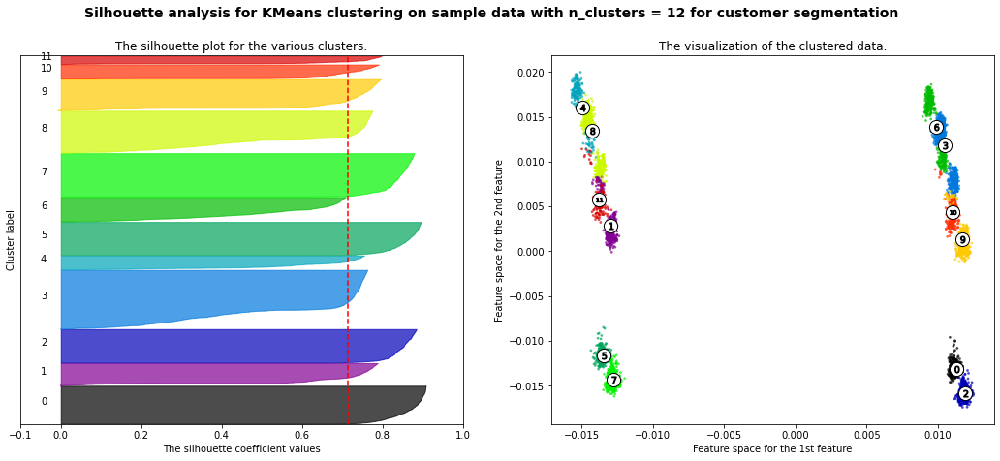

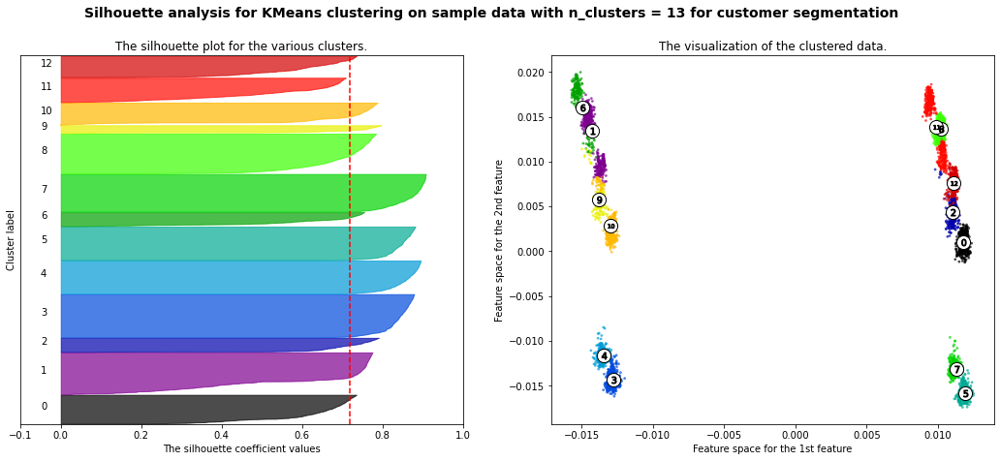

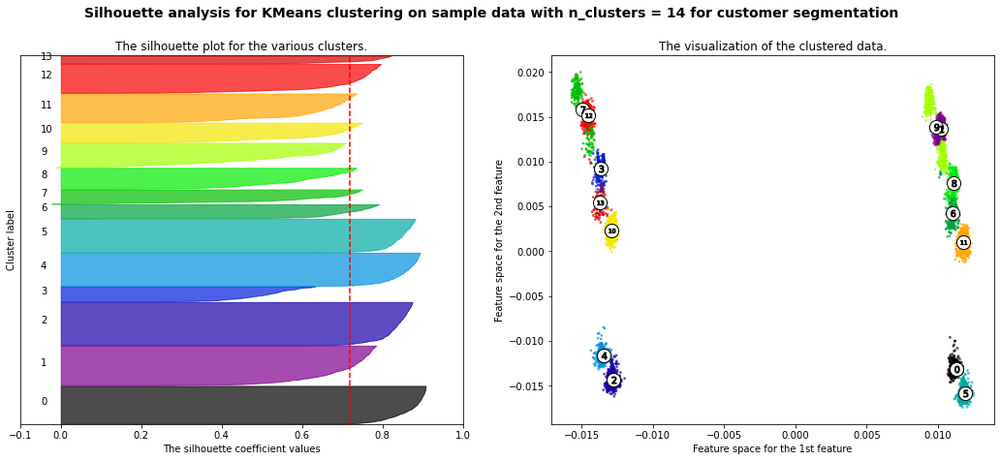

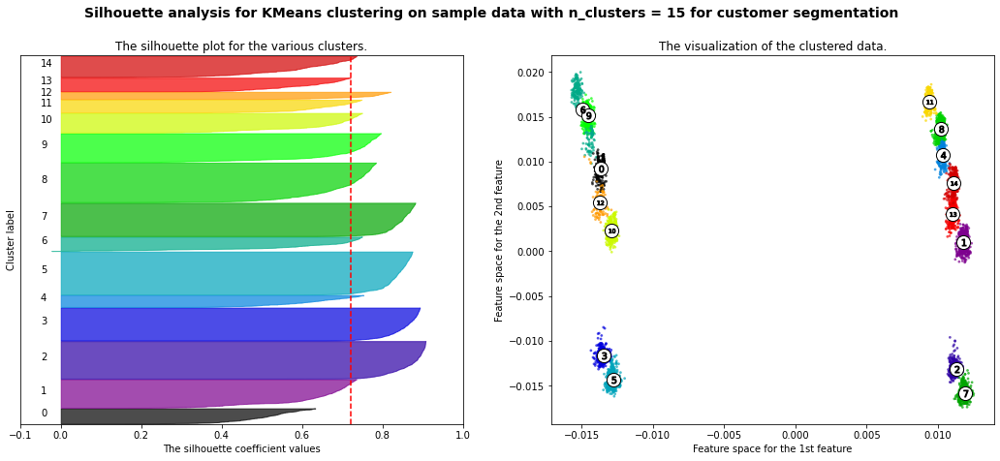

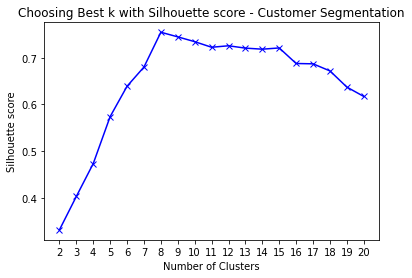

For n_clusters = 2 The average silhouette_score is : 0.33198231789376026
For n_clusters = 3 The average silhouette_score is : 0.4034777552399737
For n_clusters = 4 The average silhouette_score is : 0.47367471800638167
For n_clusters = 5 The average silhouette_score is : 0.5740868421604607
For n_clusters = 6 The average silhouette_score is : 0.6389463000177553
For n_clusters = 7 The average silhouette_score is : 0.6800104022067022
For n_clusters = 8 The average silhouette_score is : 0.7543299682430058
For n_clusters = 9 The average silhouette_score is : 0.744439836569264
For n_clusters = 10 The average silhouette_score is : 0.7342024014877087
For n_clusters = 11 The average silhouette_score is : 0.7222485128159863
For n_clusters = 12 The average silhouette_score is : 0.7254075584879195
For n_clusters = 13 The average silhouette_score is : 0.7203945027726865
For n_clusters = 14 The average silhouette_score is : 0.7181347521096205
For n_clusters = 15 The average silhouette_score is : 0.72

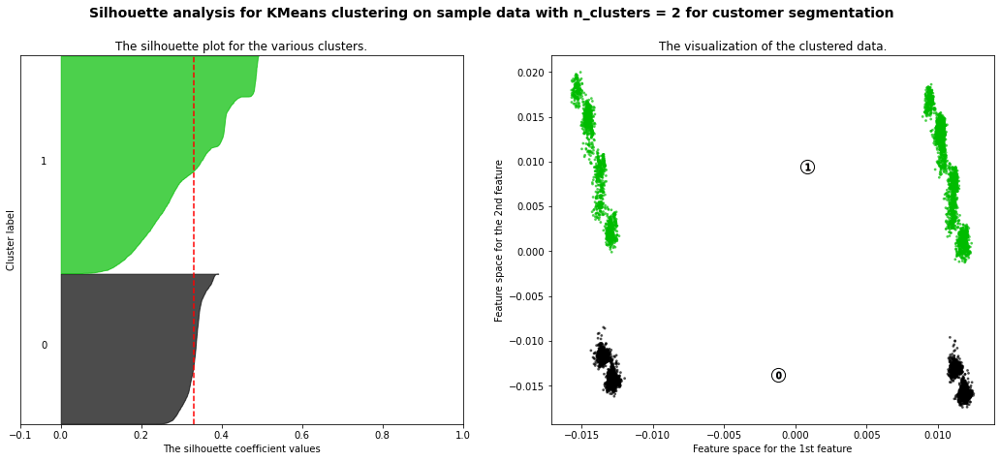

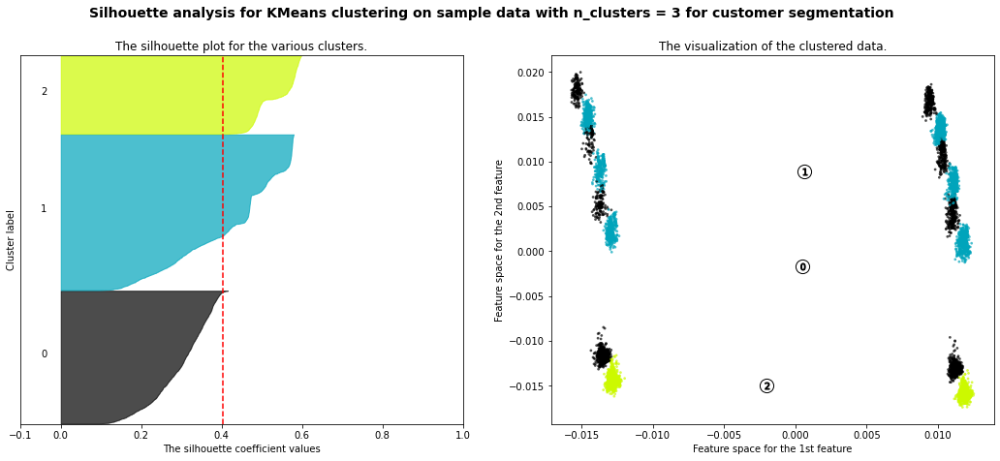

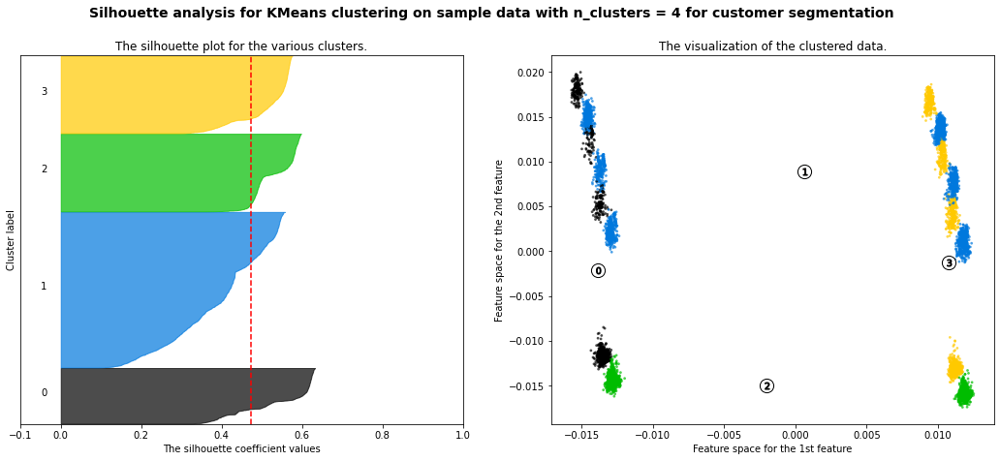

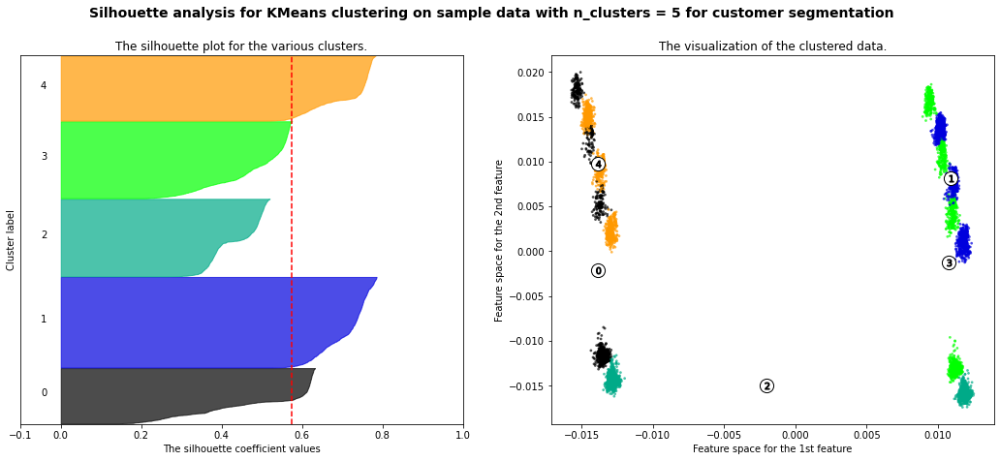

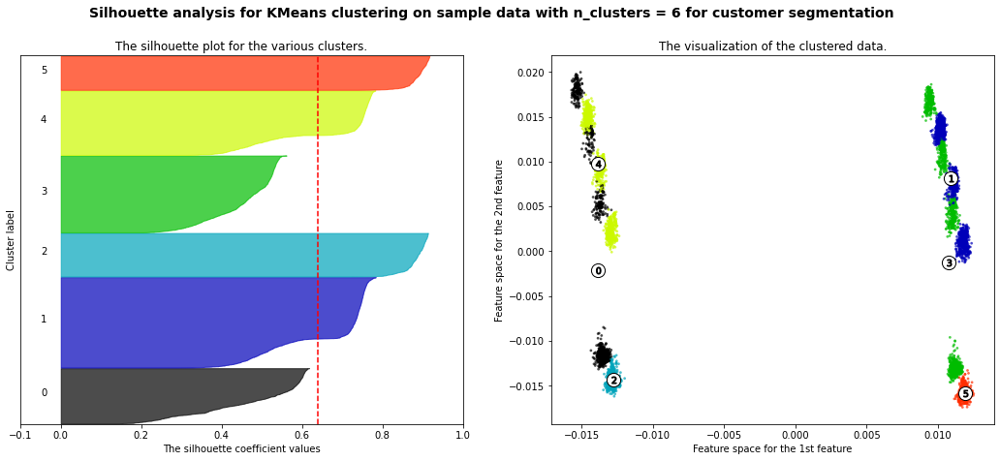

...

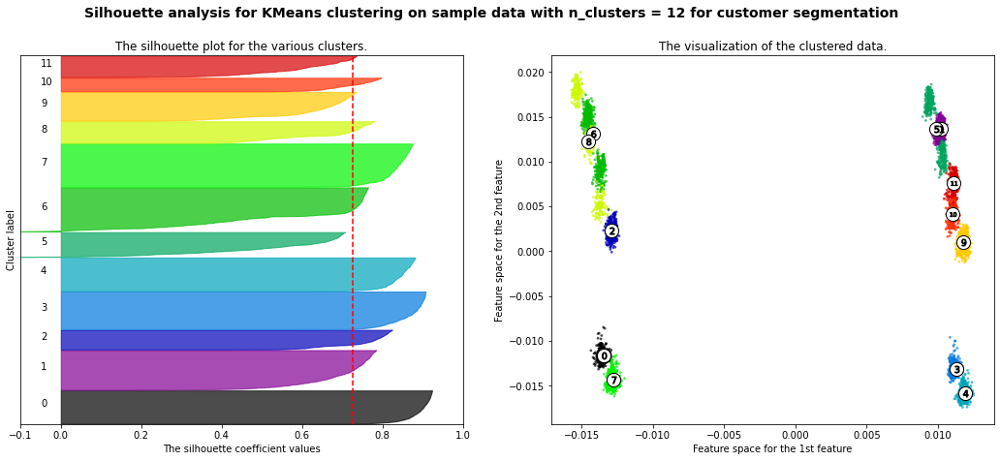

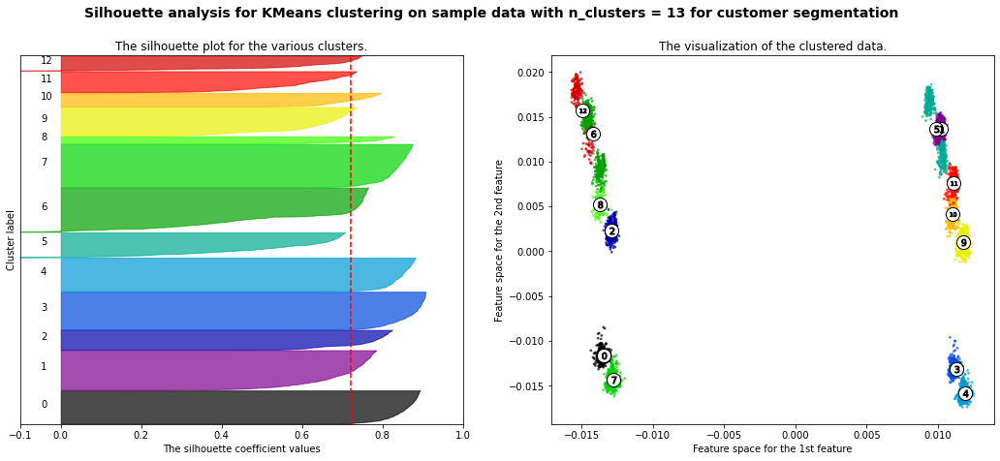

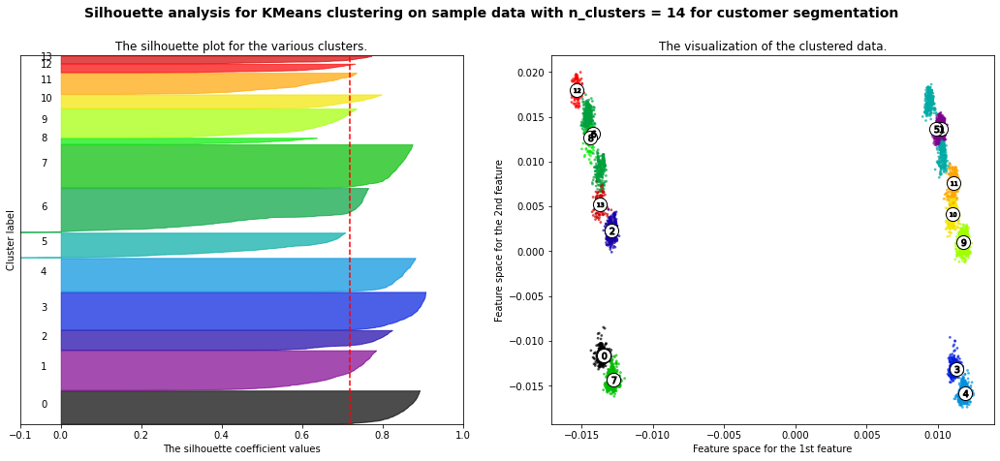

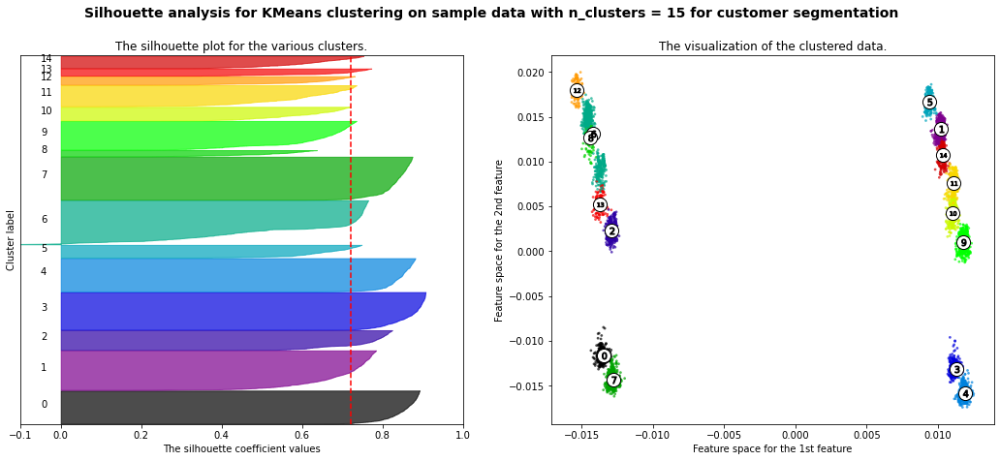

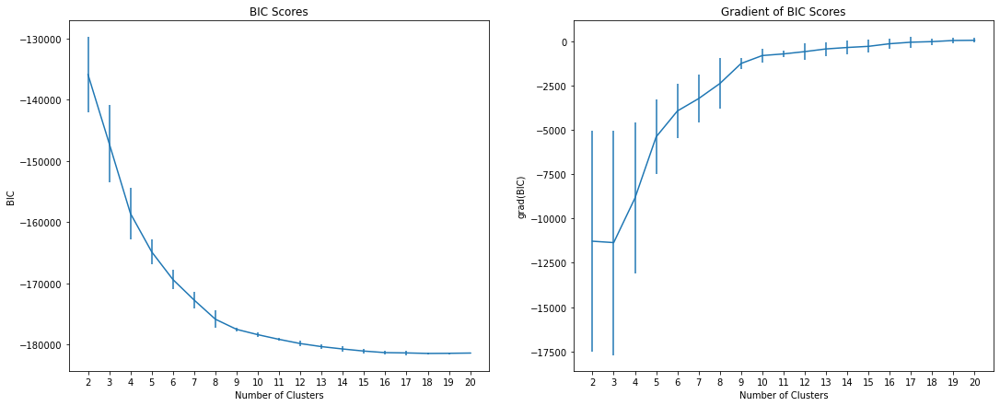

In [26]:
## redo clustering after ICA
distortion(ica_result, 21, KMeans)
silhoutte(ica_result, 21, KMeans)
silhoutte_plot(ica_result, 16, KMeans)
silhoutte(ica_result, 21, GaussianMixture)
silhoutte_plot(ica_result, 16, GaussianMixture)
EM_BIC(ica_result, 21)

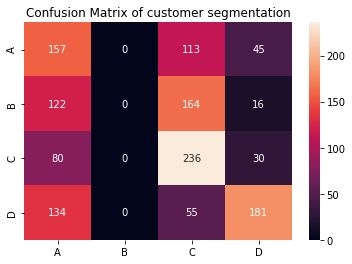

Accuracy
0.43060765191297823
--------------------------------------------------------------------------------------------------------------


In [42]:
## choose 8 cluster using KMEAN for ICA, add as another feature and rerun neural net
clf=KMeans(8, random_state=42).fit(ica_result) 
cluster_labels=clf.predict(ica_result)
cluster_labels = np.reshape(cluster_labels, (-1, 1))

scaler = MinMaxScaler()
cluster_labels = scaler.fit_transform(cluster_labels)

ica_result =np.hstack((ica_result, cluster_labels))


train_features_ICA, test_features_ICA, train_labels, test_labels = train_test_split(ica_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)

## rerun NN after ICA and clusteriong

MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_ICA, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_ICA)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

###### Randomized projection

In [28]:
### choose best number of components of randomized projection through random forest classfier
for i in range(2,10):
    rp = GaussianRandomProjection(n_components=i, eps=0.1,random_state=12) 
    rp_result = rp.fit_transform(features)
    train_features_RP, test_features_RP, train_labels, test_labels = train_test_split(rp_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)
    
    clf = RandomForestClassifier(criterion='entropy', max_depth=5,min_samples_split=2, min_samples_leaf = 8, random_state = 42)

    clf.fit(train_features_RP, train_labels)
    test_pred_decision_tree = clf.predict(test_features_RP)
    print("For n component =",
            i,metrics.accuracy_score(test_labels, test_pred_decision_tree))

For n component = 2 0.4216054013503376
For n component = 3 0.43060765191297823
For n component = 4 0.44561140285071266
For n component = 5 0.47936984246061515
For n component = 6 0.4876219054763691
For n component = 7 0.49212303075768943
For n component = 8 0.49212303075768943
For n component = 9 0.49962490622655664


In [29]:
## n component chose to be 9
rp = GaussianRandomProjection(n_components=9, eps=0.1,random_state=12)  
rp_result = rp.fit_transform(features)
print('RP Transformed Features Shape:', rp_result.shape)
train_features_RP, test_features_RP, train_labels, test_labels = train_test_split(rp_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)
print('RP Transformed Training Features Shape:', train_features_RP.shape)
print('Training Labels Shape:', train_labels.shape)
print('RP Transformed Testing Features Shape:', test_features_RP.shape)
print('Testing Labels Shape:', test_labels.shape)

RP Transformed Features Shape: (6665, 9)
RP Transformed Training Features Shape: (5332, 9)
Training Labels Shape: (5332,)
RP Transformed Testing Features Shape: (1333, 9)
Testing Labels Shape: (1333,)


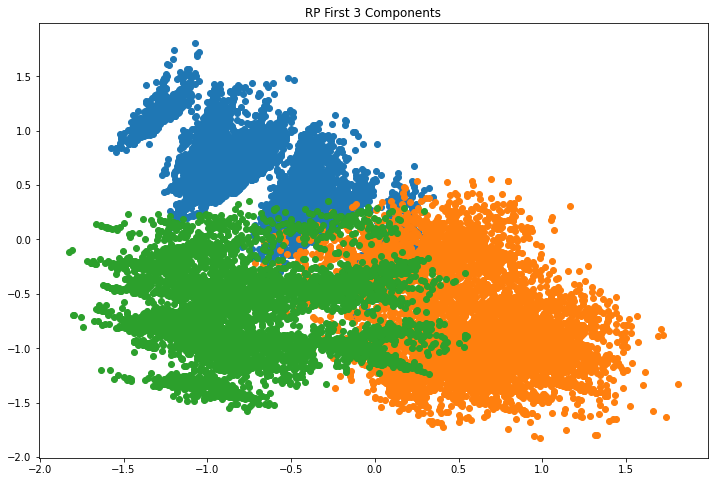

In [30]:
plt.figure(figsize=(12,8))
plt.title('RP First 3 Components')
plt.scatter(rp_result[:,0], rp_result[:,1])
plt.scatter(rp_result[:,1], rp_result[:,2])
plt.scatter(rp_result[:,2], rp_result[:,0])

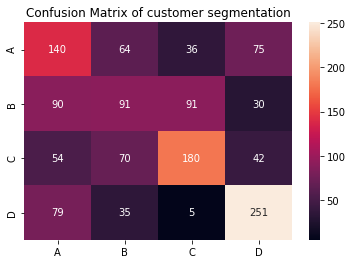

Accuracy
0.4966241560390098
--------------------------------------------------------------------------------------------------------------


In [31]:
MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_RP, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_RP)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

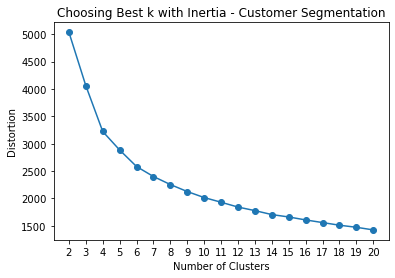

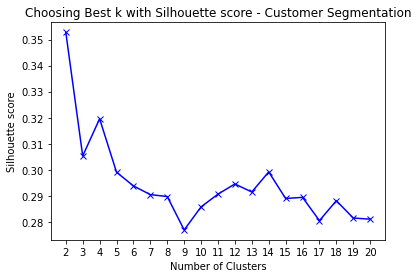

For n_clusters = 2 The average silhouette_score is : 0.35281486837425224
For n_clusters = 3 The average silhouette_score is : 0.3052943953940347
For n_clusters = 4 The average silhouette_score is : 0.31956697232517434
For n_clusters = 5 The average silhouette_score is : 0.29905494110810377
For n_clusters = 6 The average silhouette_score is : 0.2937820539386843
For n_clusters = 7 The average silhouette_score is : 0.29043460924040115
For n_clusters = 8 The average silhouette_score is : 0.28969617136163717
For n_clusters = 9 The average silhouette_score is : 0.2768759579854045
For n_clusters = 10 The average silhouette_score is : 0.28572918143277976
For n_clusters = 11 The average silhouette_score is : 0.29062272516634186
For n_clusters = 12 The average silhouette_score is : 0.2945185387036801
For n_clusters = 13 The average silhouette_score is : 0.2914431902267991
For n_clusters = 14 The average silhouette_score is : 0.29916421382804853
For n_clusters = 15 The average silhouette_score is

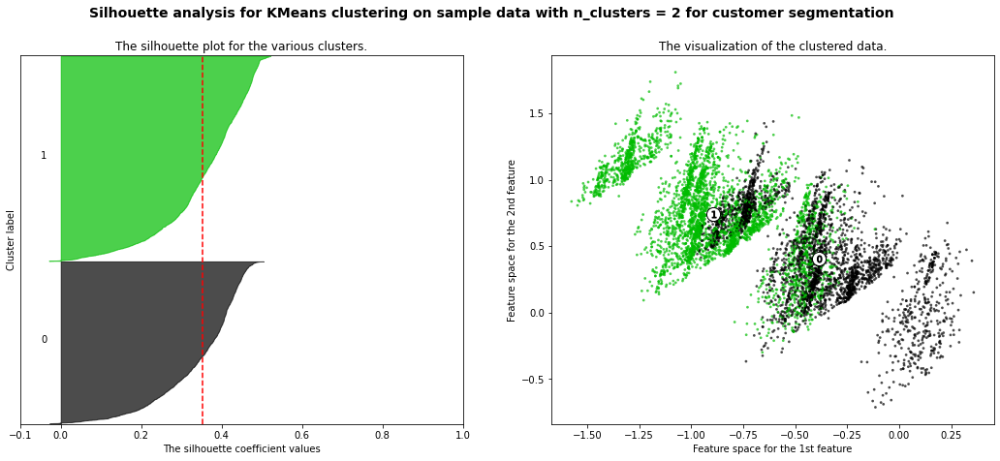

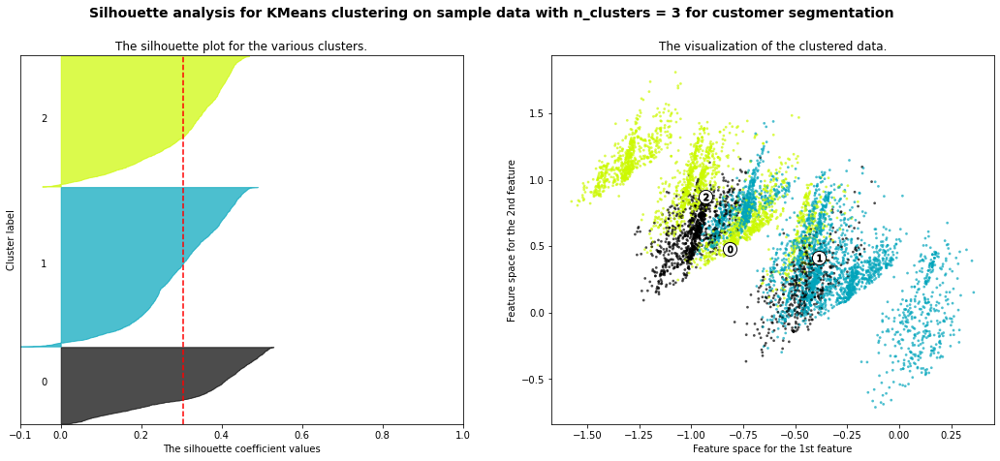

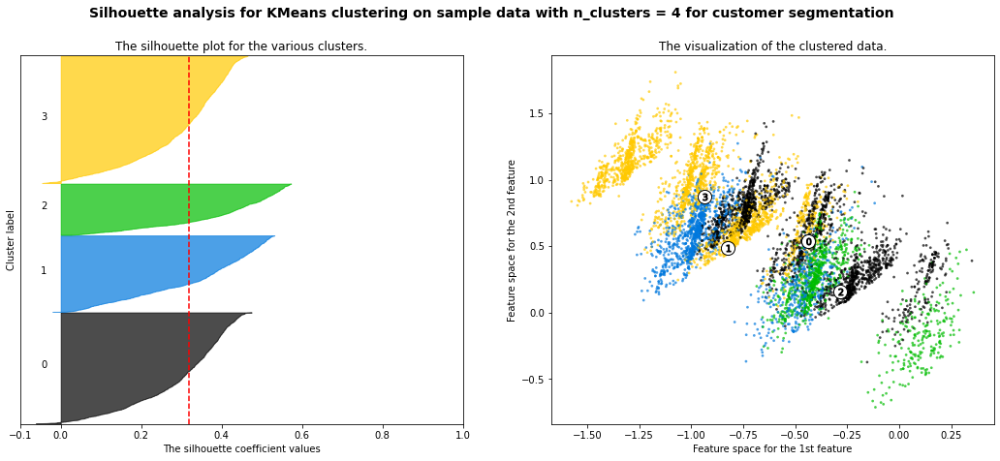

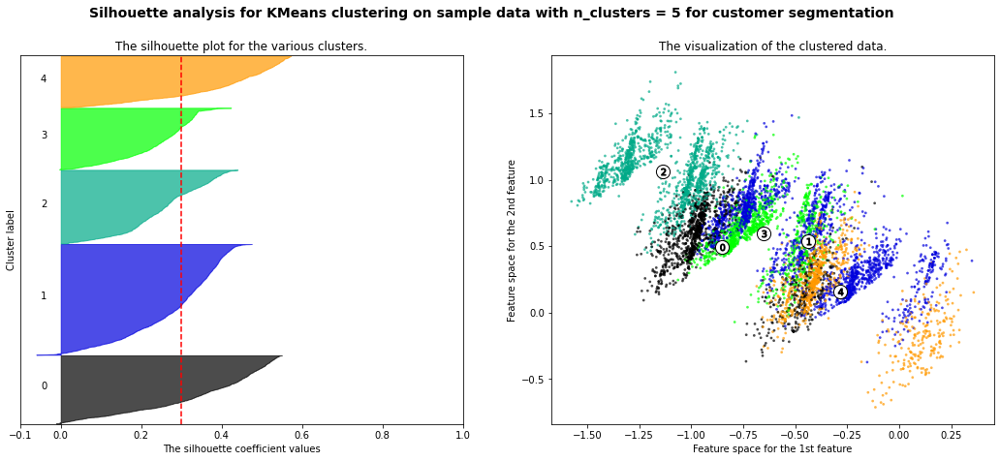

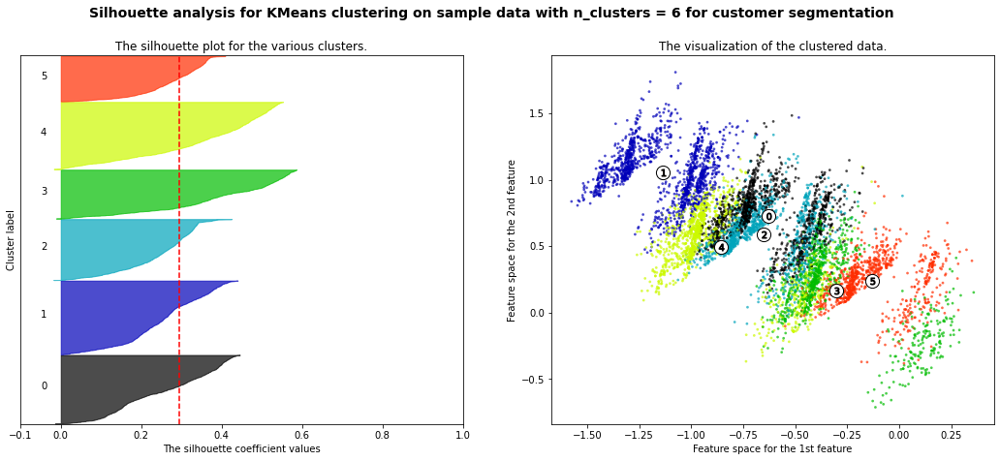

...

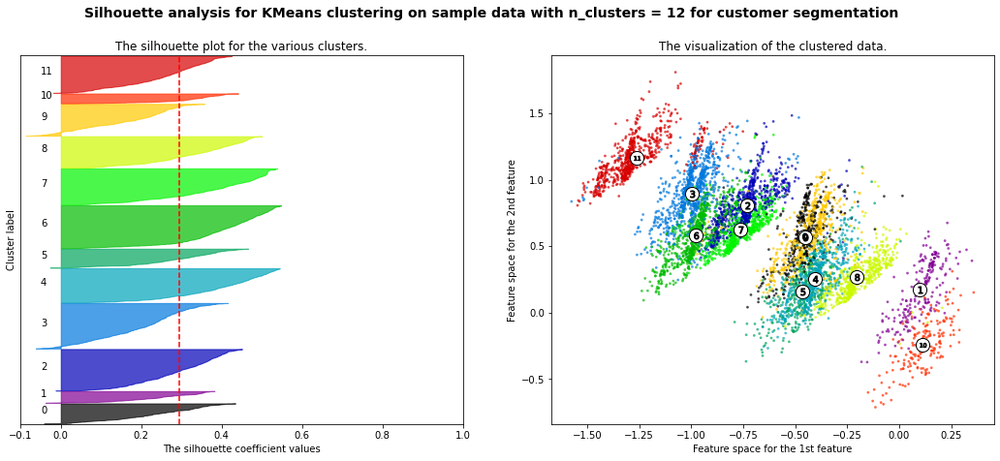

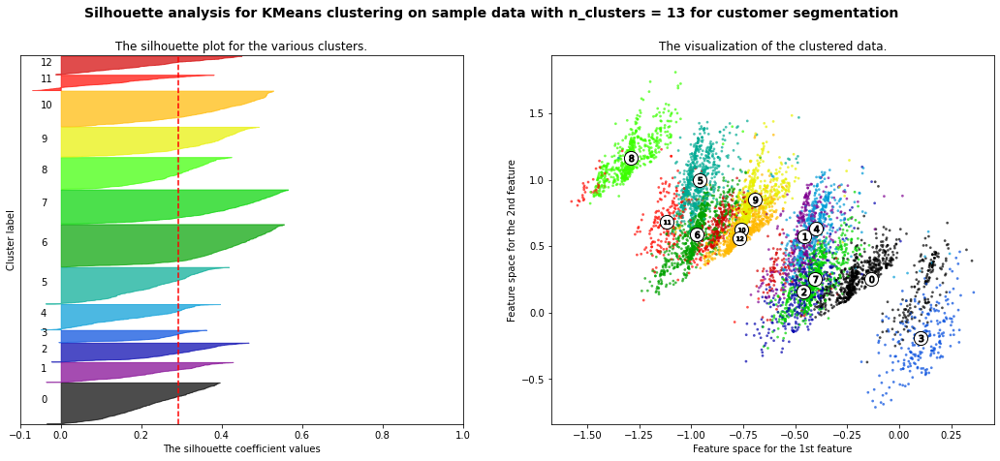

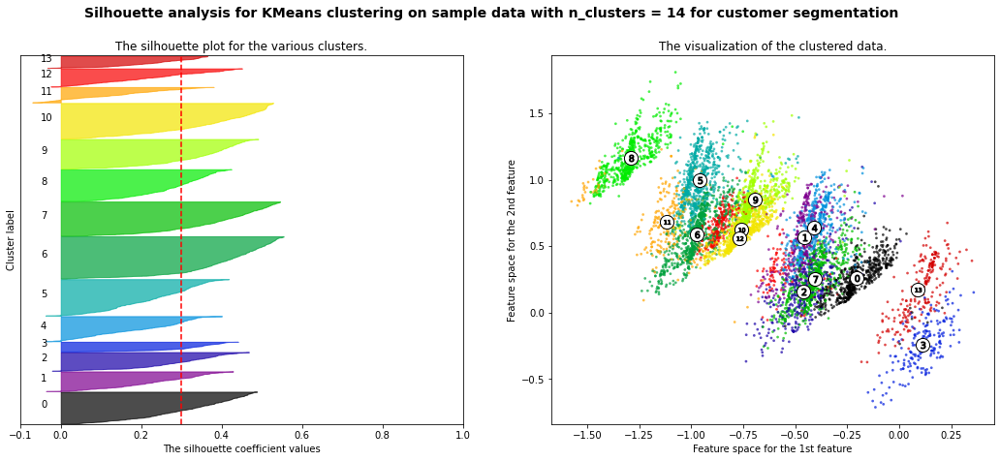

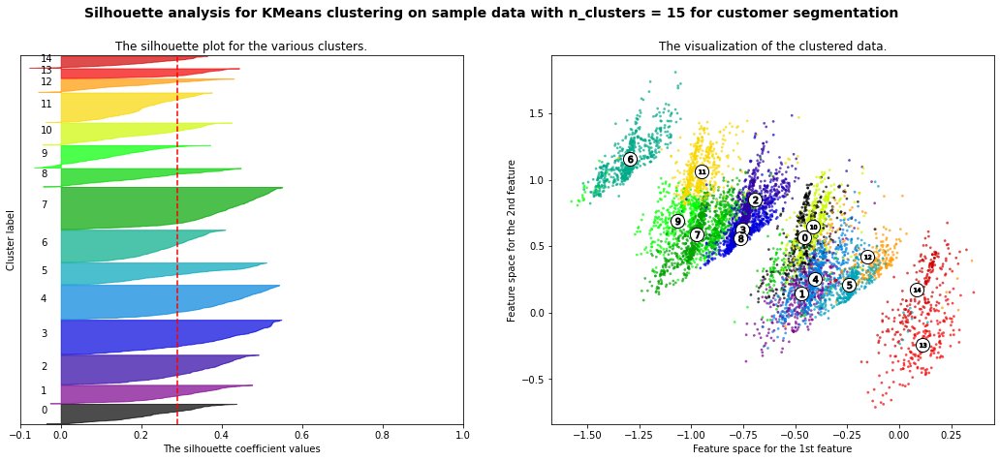

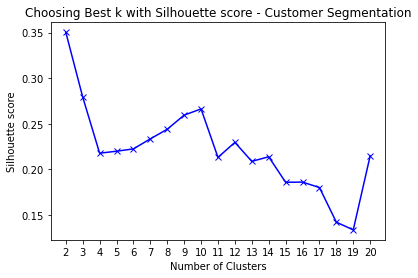

For n_clusters = 2 The average silhouette_score is : 0.3503999261140598
For n_clusters = 3 The average silhouette_score is : 0.2792954221983336
For n_clusters = 4 The average silhouette_score is : 0.2175760660372023
For n_clusters = 5 The average silhouette_score is : 0.2197424585965364
For n_clusters = 6 The average silhouette_score is : 0.2222962184000173
For n_clusters = 7 The average silhouette_score is : 0.23332764829794927
For n_clusters = 8 The average silhouette_score is : 0.24388297280893054
For n_clusters = 9 The average silhouette_score is : 0.2593808883854752
For n_clusters = 10 The average silhouette_score is : 0.2661868809887197
For n_clusters = 11 The average silhouette_score is : 0.21297386021651246
For n_clusters = 12 The average silhouette_score is : 0.2294598294682668
For n_clusters = 13 The average silhouette_score is : 0.20861741993647076
For n_clusters = 14 The average silhouette_score is : 0.21364548938499106
For n_clusters = 15 The average silhouette_score is : 

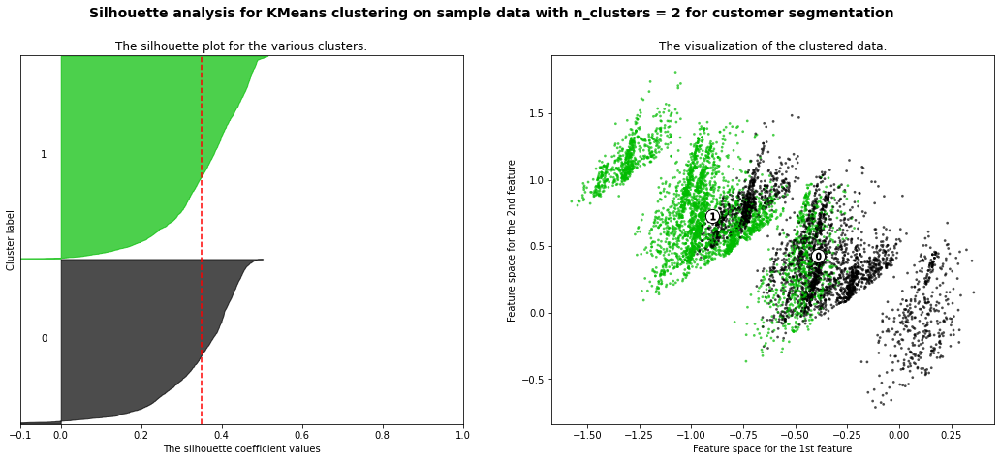

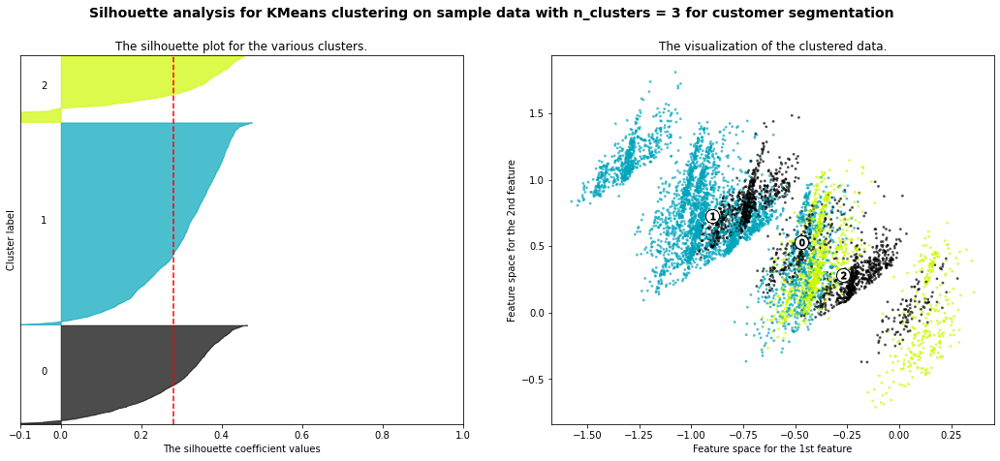

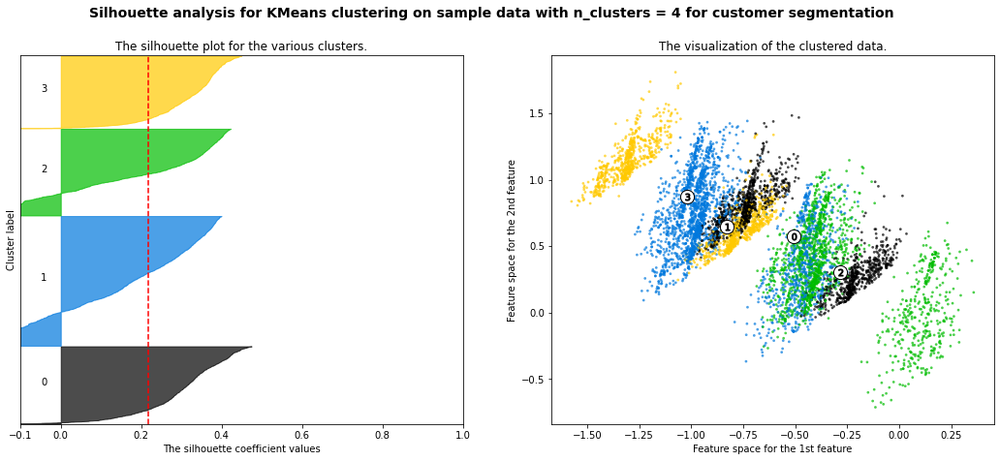

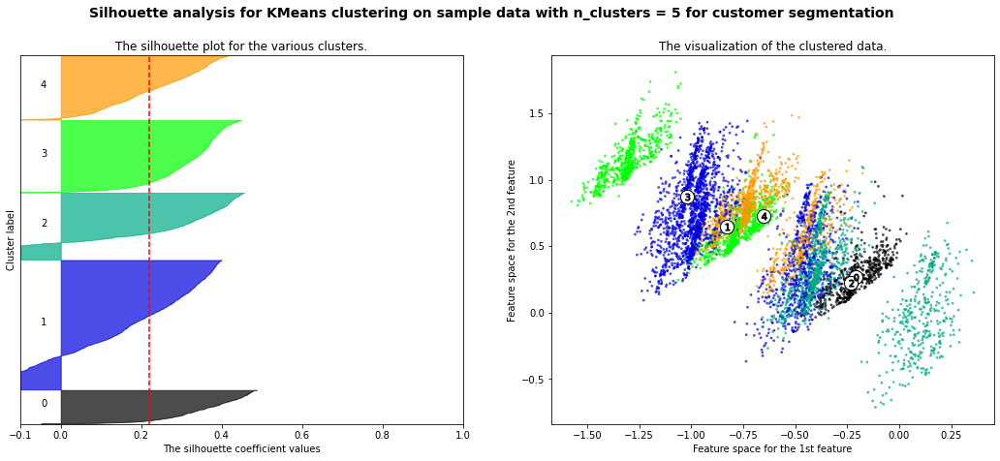

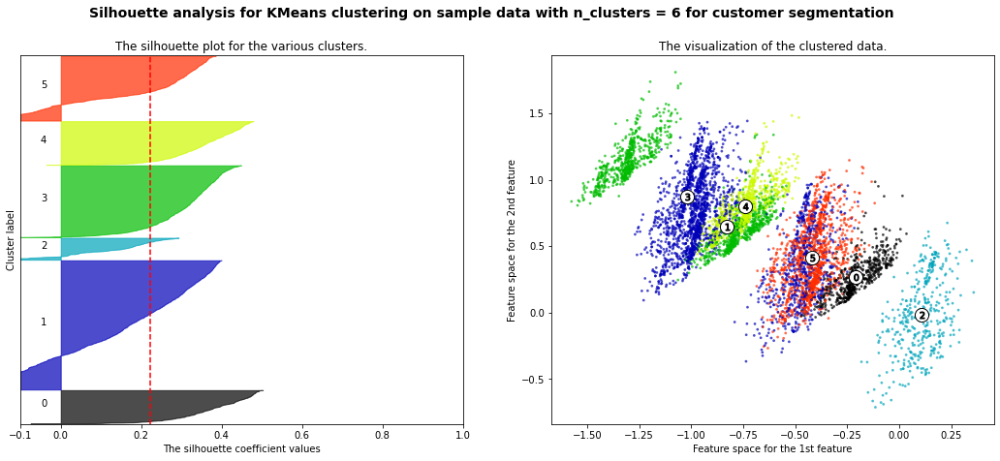

...

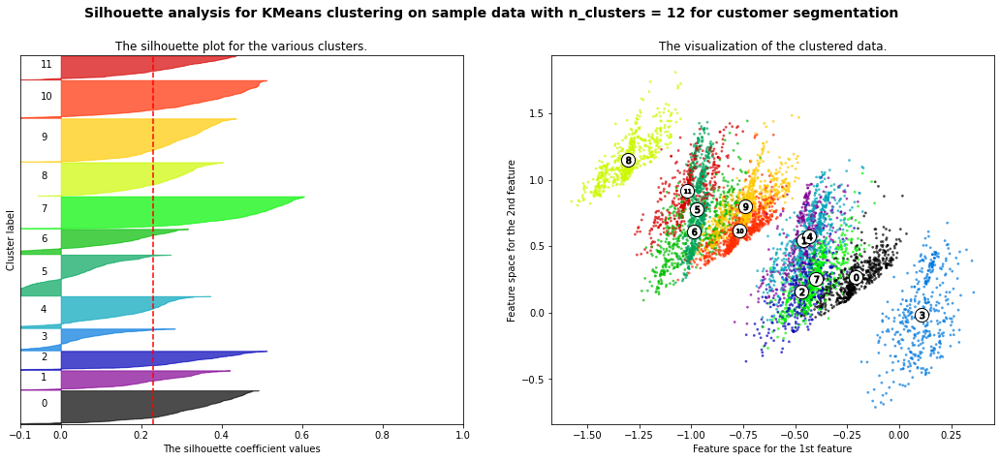

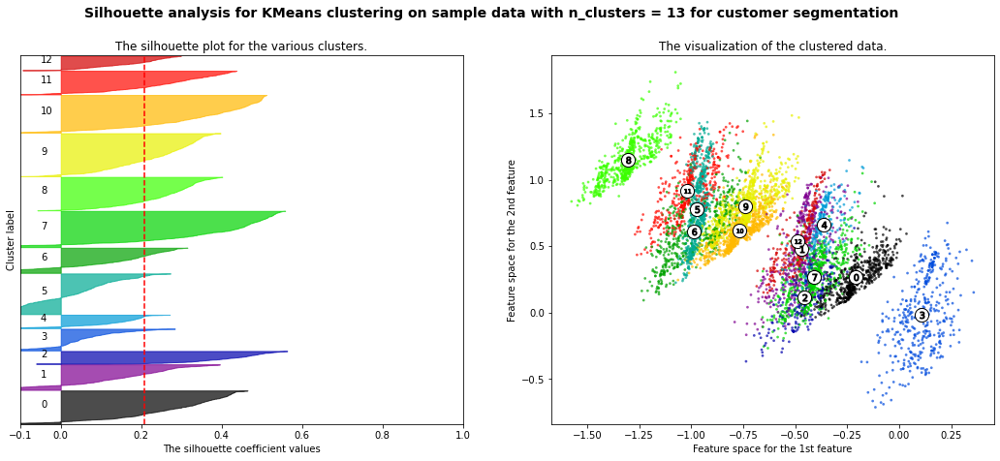

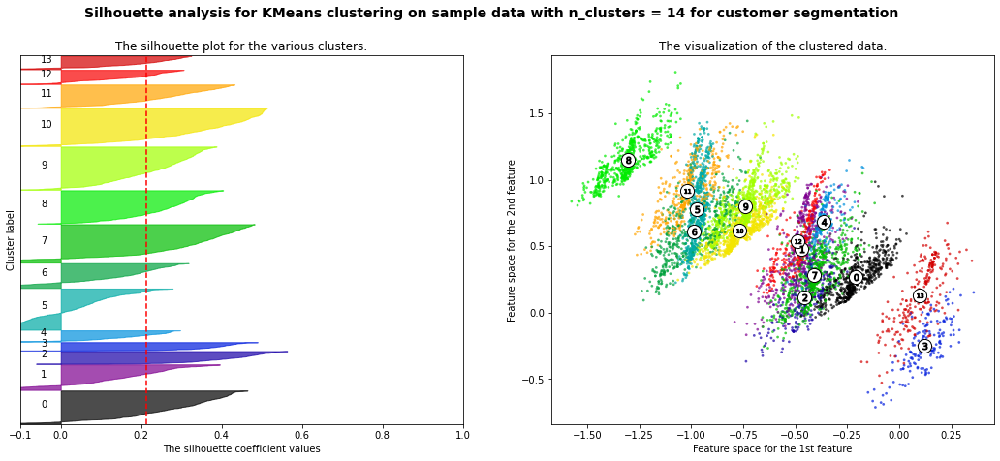

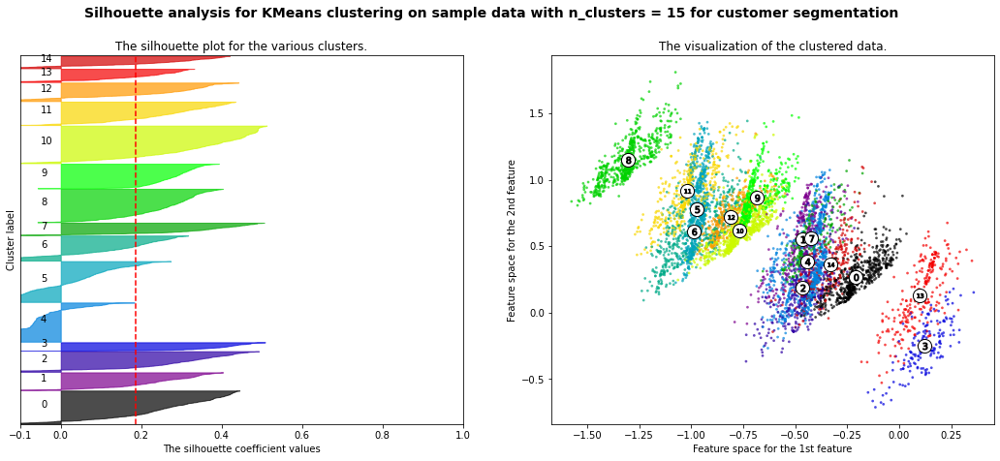

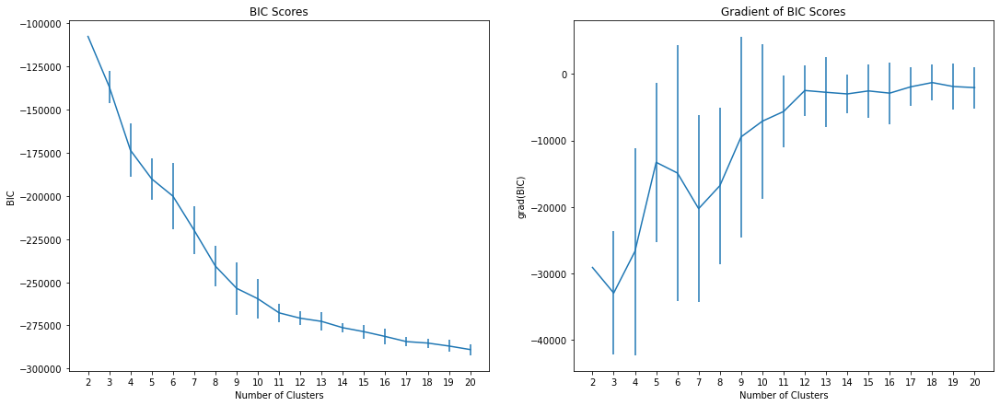

In [32]:
## redo clustering after RP
distortion(rp_result, 21, KMeans)
silhoutte(rp_result, 21, KMeans)
silhoutte_plot(rp_result, 16, KMeans)
silhoutte(rp_result, 21, GaussianMixture)
silhoutte_plot(rp_result, 16, GaussianMixture)
EM_BIC(rp_result, 21)

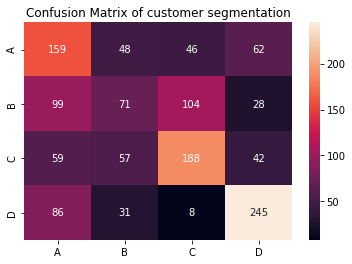

Accuracy
0.4973743435858965
--------------------------------------------------------------------------------------------------------------


In [33]:
## choose 2 cluster using KMEAN for RP, add as another feature and rerun neural net
clf=KMeans(2, random_state=42).fit(rp_result) 
cluster_labels=clf.predict(rp_result)
cluster_labels = np.reshape(cluster_labels, (-1, 1))

scaler = MinMaxScaler()
cluster_labels = scaler.fit_transform(cluster_labels)

rp_result =np.hstack((rp_result, cluster_labels))


train_features_RP, test_features_RP, train_labels, test_labels = train_test_split(rp_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)

## rerun NN after RP and clusteriong

MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_RP, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_RP)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

###### correlation filter

In [34]:
pd.DataFrame(features).corr()

,0,1,2,3,4,5,6,7,8
0,1.000000,-0.188769,-0.281772,0.021269,0.567729,0.247250,0.037400,-0.277755,0.171659
1,-0.188769,1.000000,-0.069123,-0.052294,-0.092892,0.032257,-0.031260,0.052204,0.026172
2,-0.281772,-0.069123,1.000000,0.058025,-0.083559,-0.234985,0.099981,-0.113809,-0.142051
3,0.021269,-0.052294,0.058025,1.000000,0.114869,-0.045263,0.028924,-0.057802,0.023131
4,0.567729,-0.092892,-0.083559,0.114869,1.000000,0.202987,-0.138948,-0.632835,0.090855
5,0.247250,0.032257,-0.234985,-0.045263,0.202987,1.000000,-0.302366,-0.164737,0.127577
6,0.037400,-0.031260,0.099981,0.028924,-0.138948,-0.302366,1.000000,0.229339,-0.035650
7,-0.277755,0.052204,-0.113809,-0.057802,-0.632835,-0.164737,0.229339,1.000000,-0.045211
8,0.171659,0.026172,-0.142051,0.023131,0.090855,0.127577,-0.035650,-0.045211,1.000000


In [35]:
print(feature_list)

['Age', 'Work_Experience', 'Family_Size', 'Gender_Cat', 'Ever_Married_Cat', 'Graduated_Cat', 'Profession_Cat', 'Spending_Score_Cat', 'Var_1_Cat']


In [36]:
## remove fifth feature - ever married
corr_result = np.delete(features, 4, 1)

In [37]:
pd.DataFrame(corr_result).corr()

,0,1,2,3,4,5,6,7
0,1.000000,-0.188769,-0.281772,0.021269,0.247250,0.037400,-0.277755,0.171659
1,-0.188769,1.000000,-0.069123,-0.052294,0.032257,-0.031260,0.052204,0.026172
2,-0.281772,-0.069123,1.000000,0.058025,-0.234985,0.099981,-0.113809,-0.142051
3,0.021269,-0.052294,0.058025,1.000000,-0.045263,0.028924,-0.057802,0.023131
4,0.247250,0.032257,-0.234985,-0.045263,1.000000,-0.302366,-0.164737,0.127577
5,0.037400,-0.031260,0.099981,0.028924,-0.302366,1.000000,0.229339,-0.035650
6,-0.277755,0.052204,-0.113809,-0.057802,-0.164737,0.229339,1.000000,-0.045211
7,0.171659,0.026172,-0.142051,0.023131,0.127577,-0.035650,-0.045211,1.000000


In [38]:
print('CORR Transformed Features Shape:', corr_result.shape)
train_features_CORR, test_features_CORR, train_labels, test_labels = train_test_split(corr_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)
print('CORR Transformed Training Features Shape:', train_features_CORR.shape)
print('Training Labels Shape:', train_labels.shape)
print('CORR Transformed Testing Features Shape:', test_features_CORR.shape)
print('Testing Labels Shape:', test_labels.shape)

CORR Transformed Features Shape: (6665, 8)
CORR Transformed Training Features Shape: (5332, 8)
Training Labels Shape: (5332,)
CORR Transformed Testing Features Shape: (1333, 8)
Testing Labels Shape: (1333,)


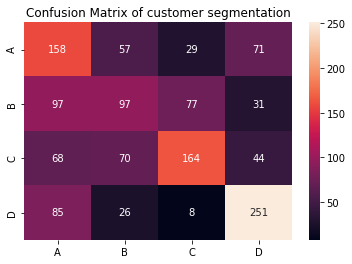

Accuracy
0.5026256564141035
--------------------------------------------------------------------------------------------------------------


In [39]:
MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_CORR, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_CORR)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')

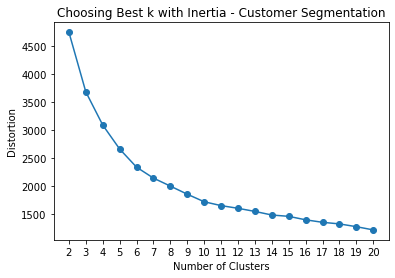

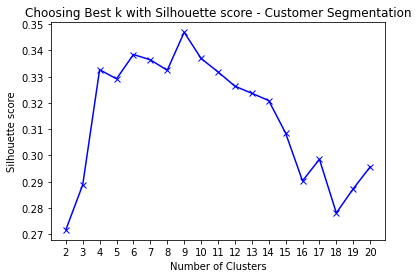

For n_clusters = 2 The average silhouette_score is : 0.2716162451348124
For n_clusters = 3 The average silhouette_score is : 0.2887898068132011
For n_clusters = 4 The average silhouette_score is : 0.33265368186841665
For n_clusters = 5 The average silhouette_score is : 0.3291737664957712
For n_clusters = 6 The average silhouette_score is : 0.3384459732354611
For n_clusters = 7 The average silhouette_score is : 0.336429033383761
For n_clusters = 8 The average silhouette_score is : 0.33244395078709665
For n_clusters = 9 The average silhouette_score is : 0.3469315623923543
For n_clusters = 10 The average silhouette_score is : 0.3369447041819705
For n_clusters = 11 The average silhouette_score is : 0.3318302511018781
For n_clusters = 12 The average silhouette_score is : 0.3263891302847564
For n_clusters = 13 The average silhouette_score is : 0.32366960004769624
For n_clusters = 14 The average silhouette_score is : 0.32090646267704653
For n_clusters = 15 The average silhouette_score is : 0.

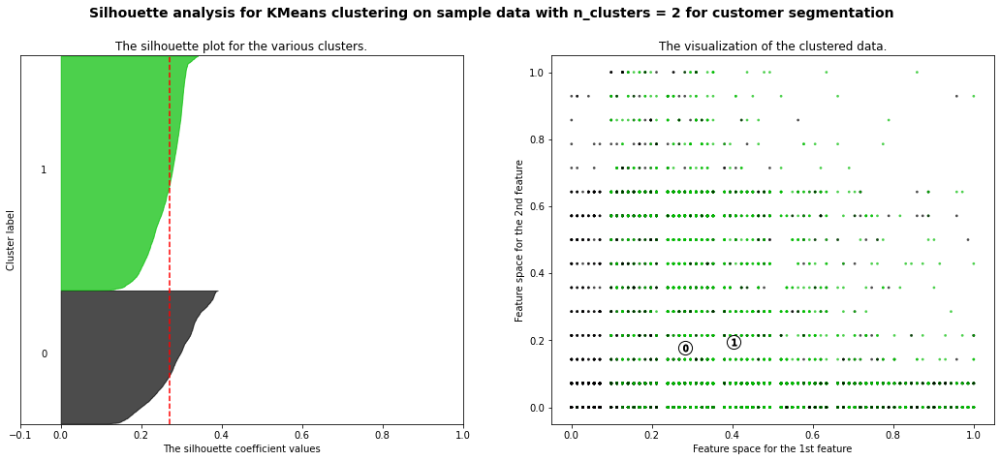

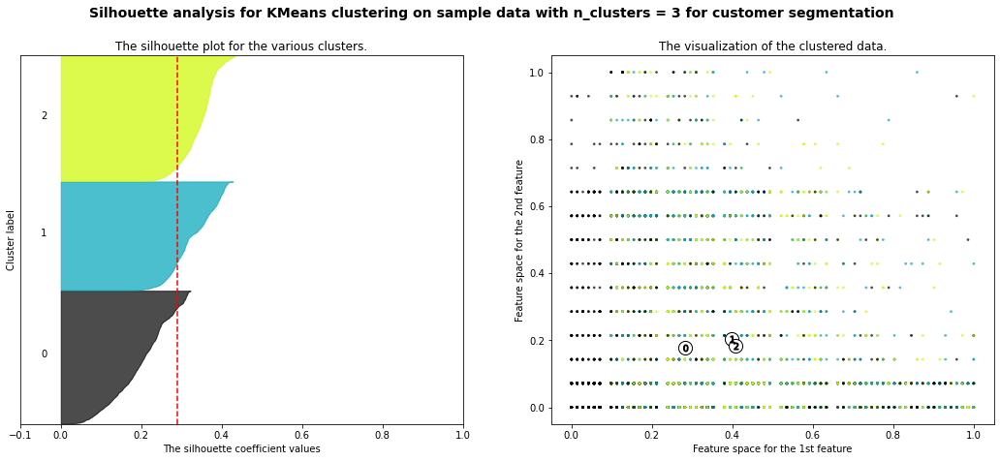

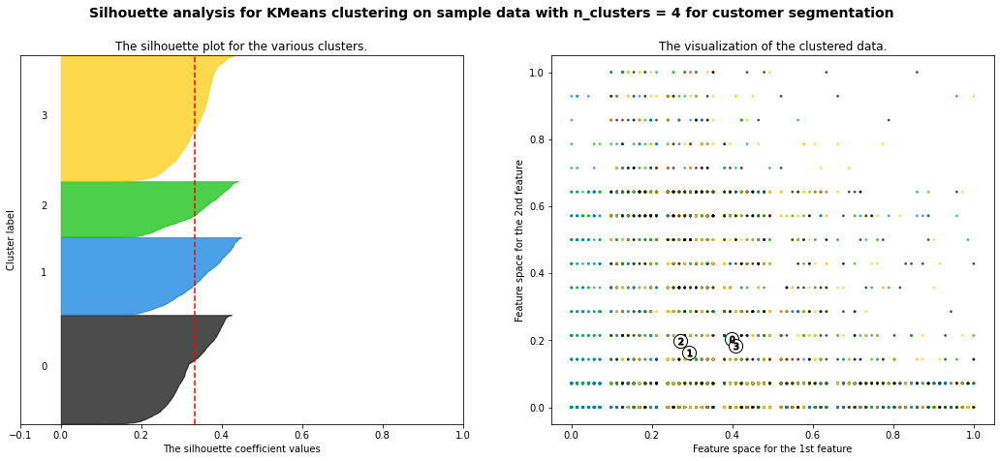

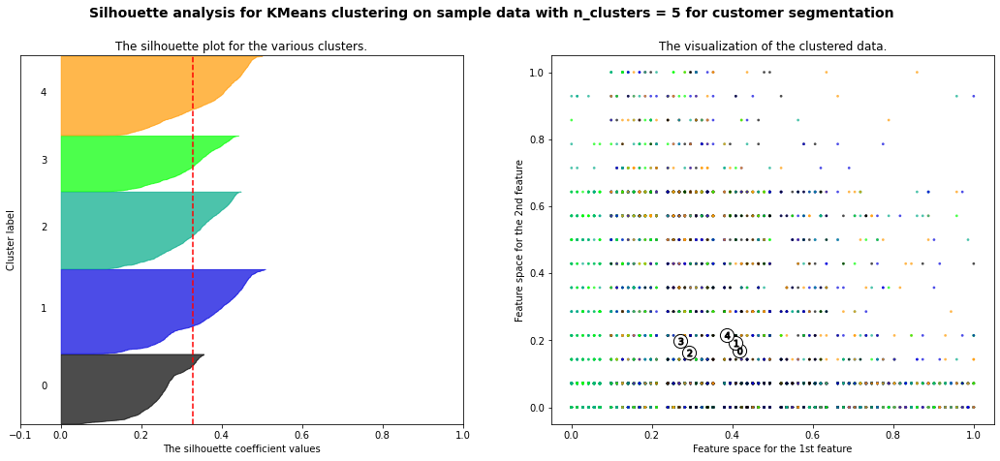

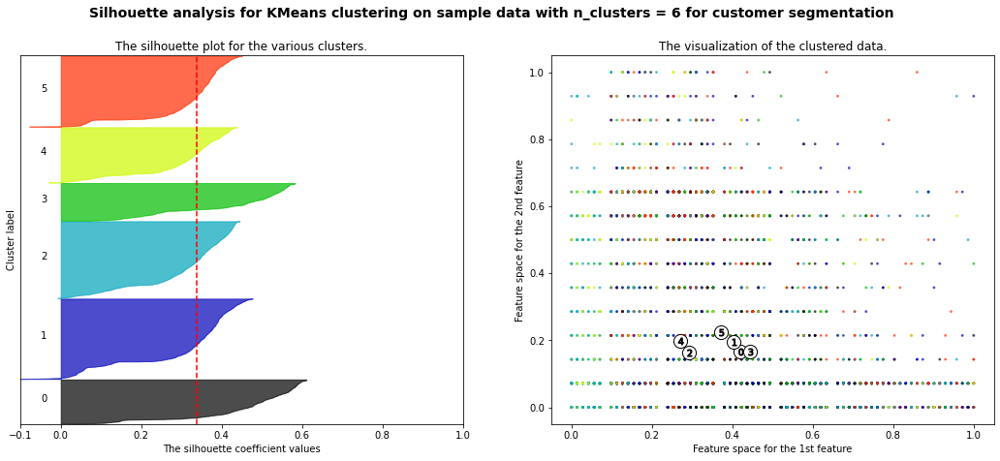

...

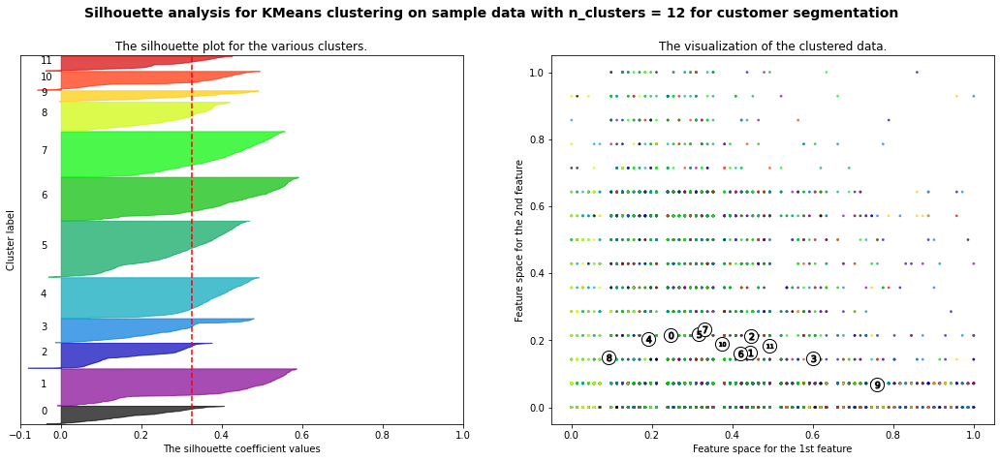

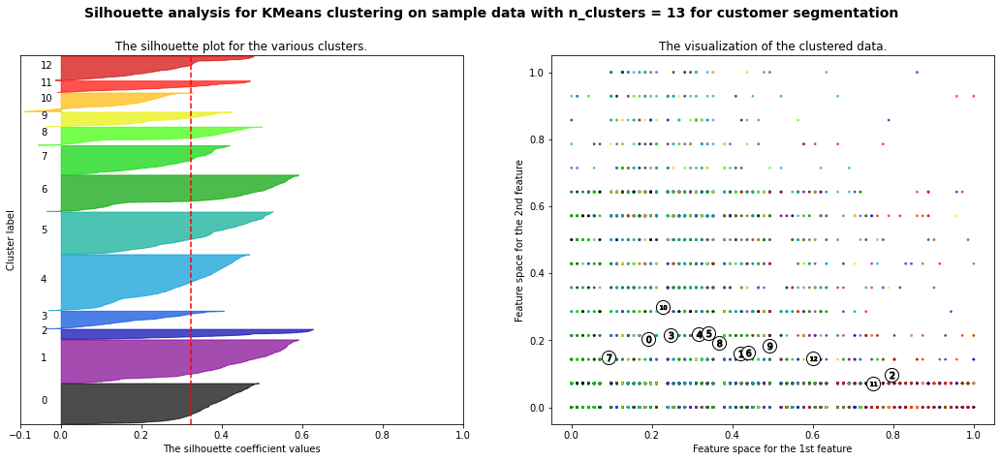

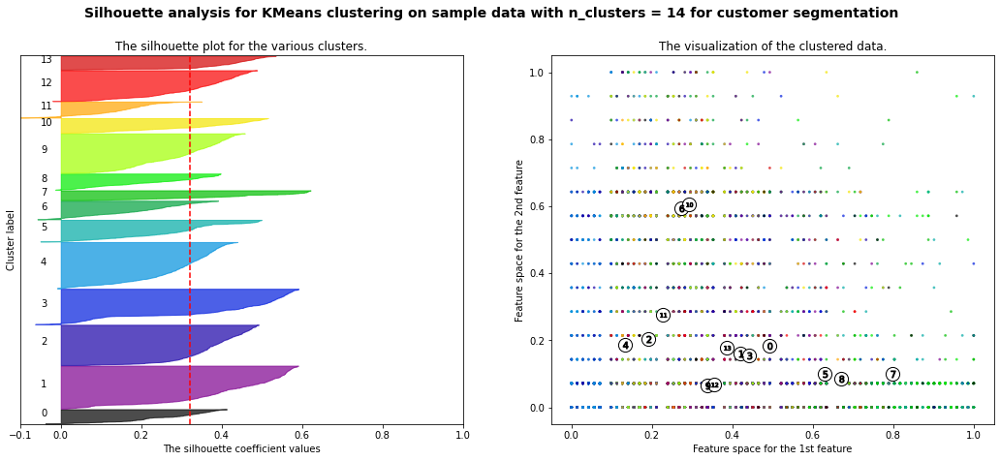

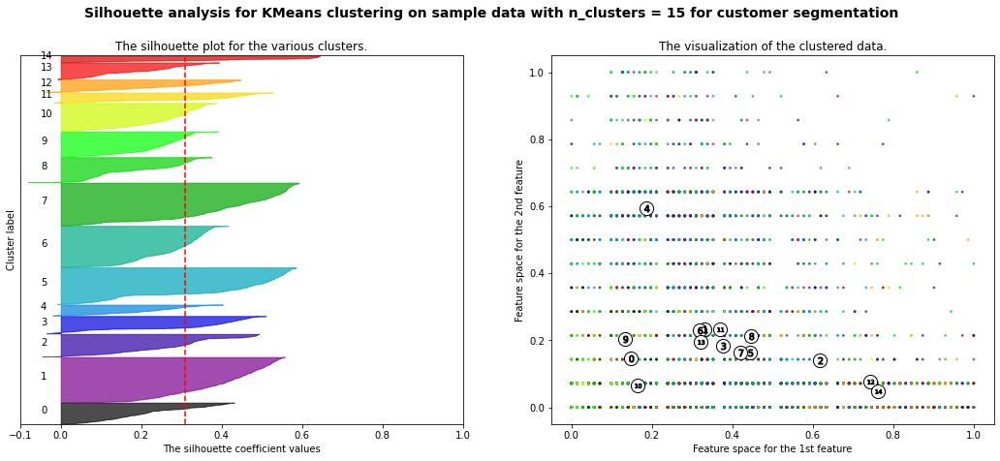

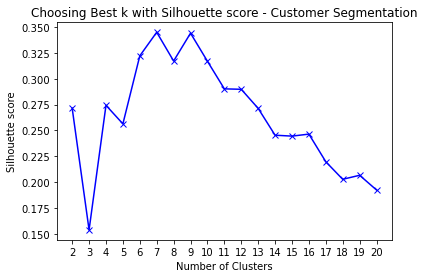

For n_clusters = 2 The average silhouette_score is : 0.2716162451348124
For n_clusters = 3 The average silhouette_score is : 0.15379084001836657
For n_clusters = 4 The average silhouette_score is : 0.2743723737029538
For n_clusters = 5 The average silhouette_score is : 0.2564397614648619
For n_clusters = 6 The average silhouette_score is : 0.32222761764417496
For n_clusters = 7 The average silhouette_score is : 0.34507580029350776
For n_clusters = 8 The average silhouette_score is : 0.3172406314122876
For n_clusters = 9 The average silhouette_score is : 0.3441795540332583
For n_clusters = 10 The average silhouette_score is : 0.31700278177108976
For n_clusters = 11 The average silhouette_score is : 0.29029378989123905
For n_clusters = 12 The average silhouette_score is : 0.2898687623294287
For n_clusters = 13 The average silhouette_score is : 0.2714021981298636
For n_clusters = 14 The average silhouette_score is : 0.24543730680632467
For n_clusters = 15 The average silhouette_score is :

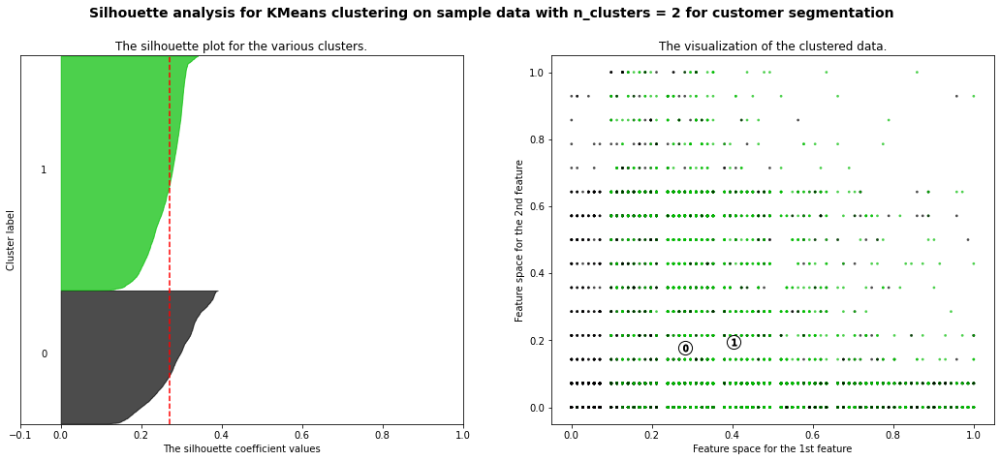

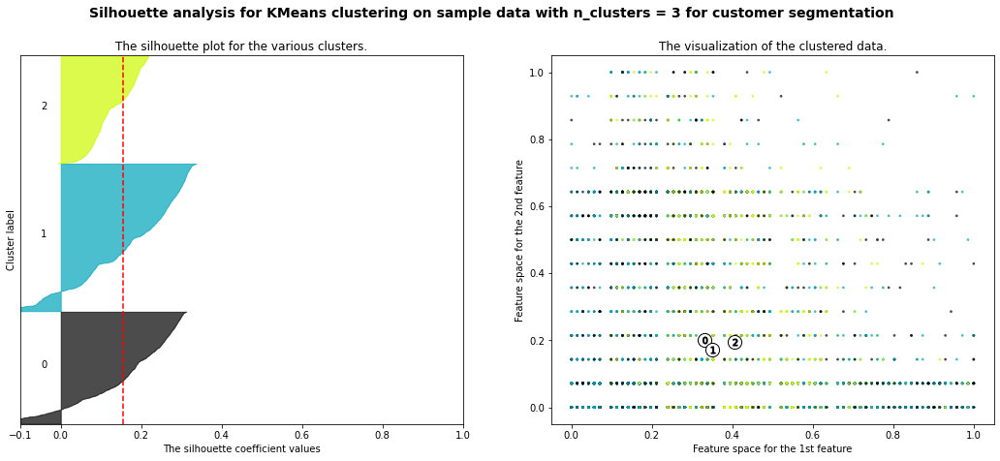

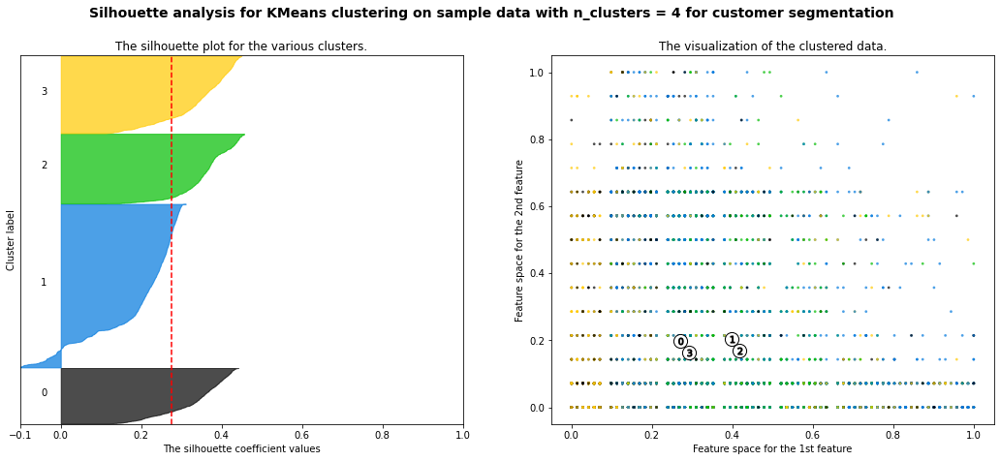

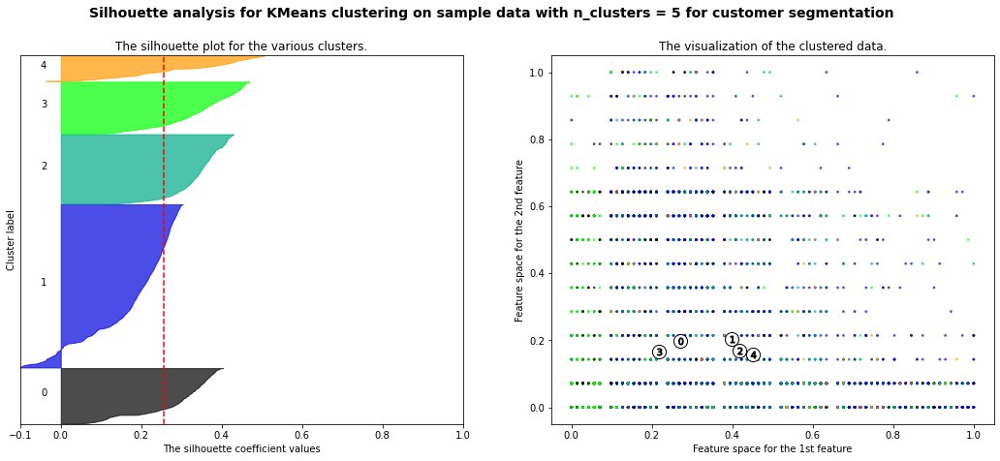

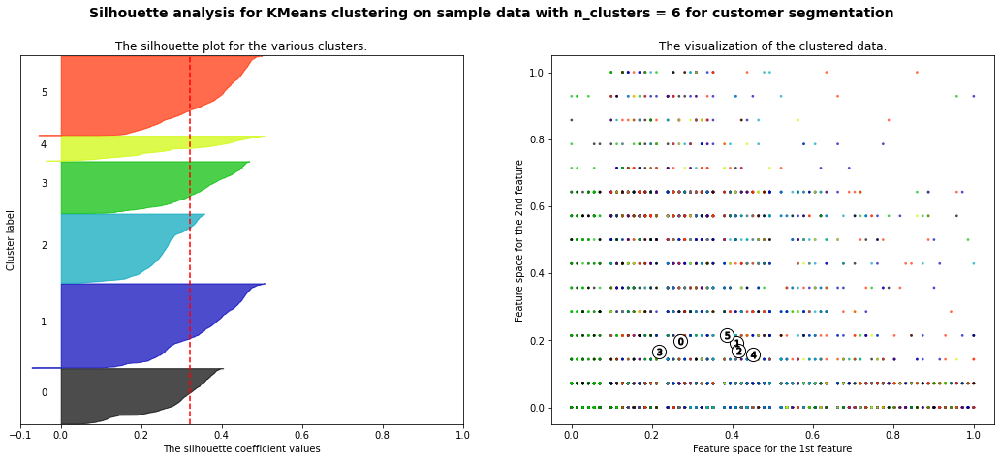

...

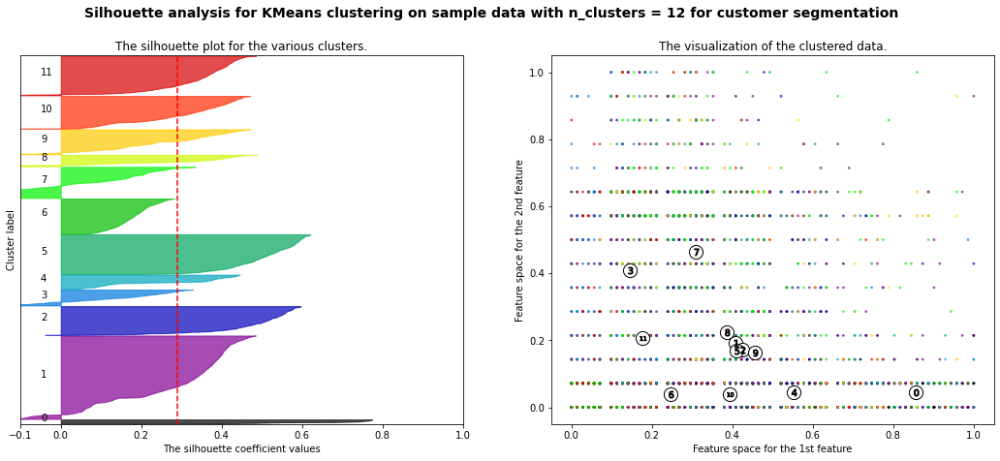

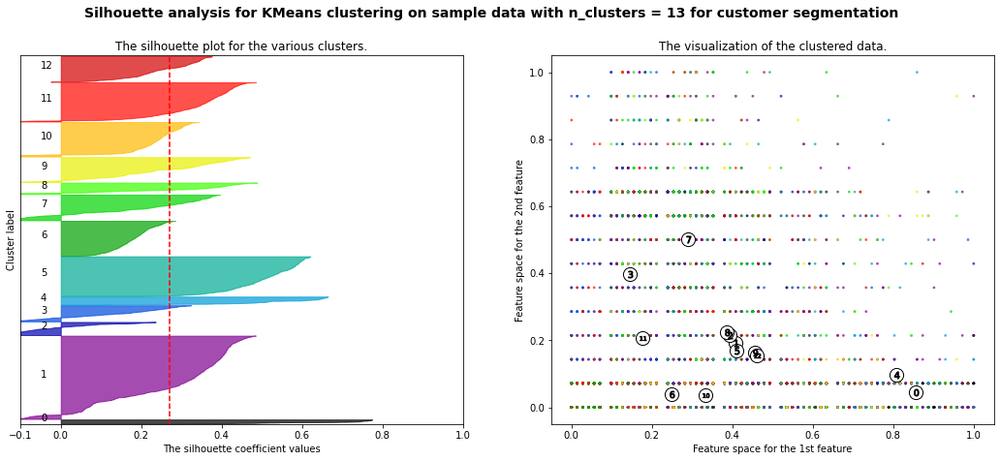

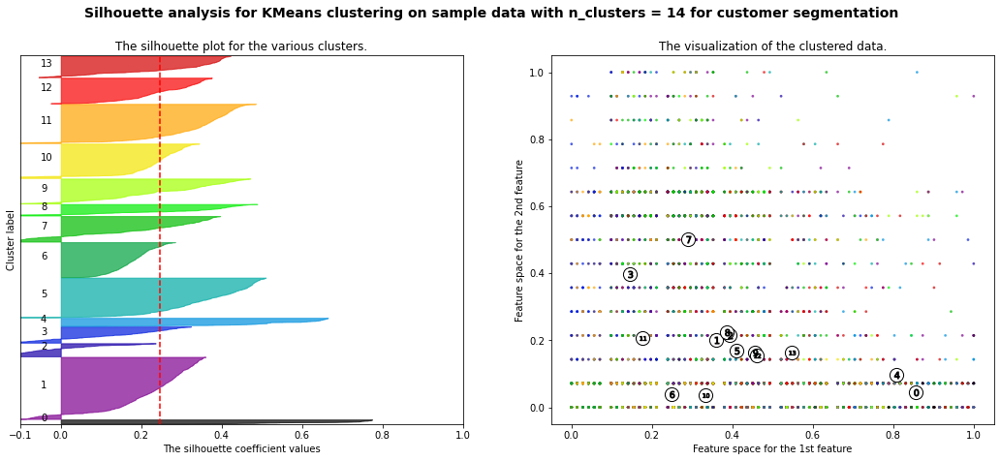

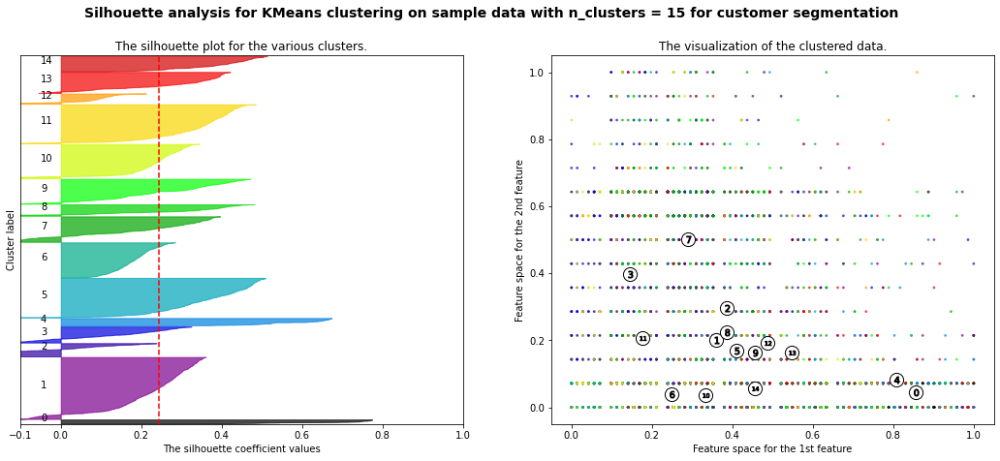

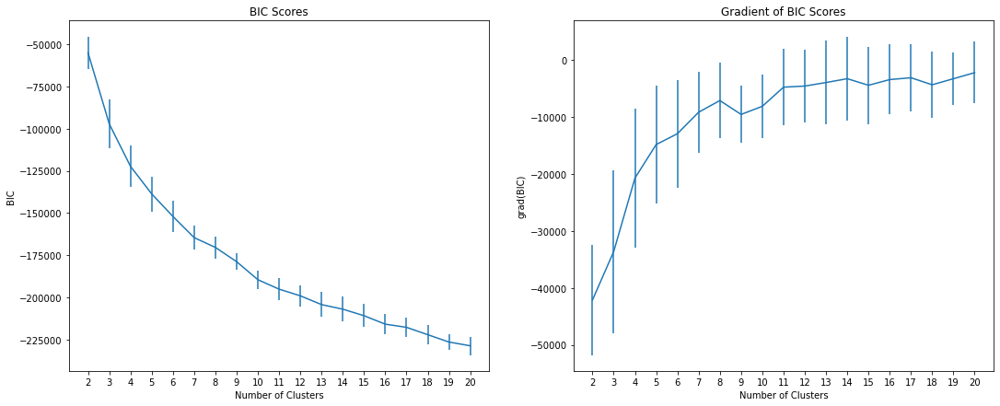

In [40]:
## redo clustering after correlation filter
distortion(corr_result, 21, KMeans)
silhoutte(corr_result, 21, KMeans)
silhoutte_plot(corr_result, 16, KMeans)
silhoutte(corr_result, 21, GaussianMixture)
silhoutte_plot(corr_result, 16, GaussianMixture)
EM_BIC(corr_result, 21)

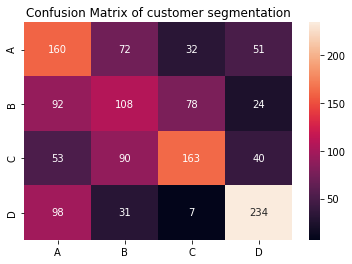

Accuracy
0.4988747186796699
--------------------------------------------------------------------------------------------------------------


In [41]:
## choose 9 cluster using KMEAN for correlation filter, add as another feature and rerun neural net
clf=KMeans(9, random_state=42).fit(corr_result) 
cluster_labels=clf.predict(corr_result)
cluster_labels = np.reshape(cluster_labels, (-1, 1))

scaler = MinMaxScaler()
cluster_labels = scaler.fit_transform(cluster_labels)

corr_result =np.hstack((corr_result, cluster_labels))


train_features_CORR, test_features_CORR, train_labels, test_labels = train_test_split(corr_result, labels_np, test_size = 0.20, 
                                                                            random_state = 42)

## rerun NN after corrlation filter and clusteriong

MLPclf = MLPClassifier(activation='logistic', hidden_layer_sizes= (100, 100, 50, 50), learning_rate_init=0.001, solver='adam', max_iter = 1000)
MLPclf.fit(train_features_CORR, train_labels)
## test performance
test_pred_MLP = MLPclf.predict(test_features_CORR)


#get the confusion matrix
confusion_matrix = metrics.confusion_matrix(test_labels,  
                                            test_pred_MLP)
#turn this into a dataframe
matrix_confusion = pd.DataFrame(confusion_matrix,index=["A", "B", "C", "D"],columns=["A", "B", "C", "D"])

ax = plt.axes()
sns.heatmap(matrix_confusion,annot=True, annot_kws={"size": 10},fmt="d", ax=ax)
ax.set_title("Confusion Matrix of customer segmentation")
plt.show()


## Performance Measurements

print('Accuracy')
print(metrics.accuracy_score(test_labels, test_pred_MLP))

print('--------------------------------------------------------------------------------------------------------------')